Тетрадка - вариант решения тестового задания. ТГ для связи: https://t.me/Serge_koval

## Основная часть

Использование встроенного в Open_CV функционала не дало достаточного качества, пришлось использовать внешние библиотеки. Кстати, и распознавание текста из цветного изображения проходит, на мой взгляд, получше, чем ч/б.

In [ ]:
!pip install easyocr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.9 MB 14.2 MB/s 
     |████████████████████████████████| 619 kB 61.9 MB/s 
     |████████████████████████████████| 145 kB 69.8 MB/s 
     |████████████████████████████████| 47.6 MB 132 kB/s 
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.6.0.66
    Uninstalling opencv-python-headless-4.6.0.66:
      Successfully uninstalled opencv-python-headless-4.6.0.66


In [ ]:
!pip install mtcnn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.3 MB 4.2 MB/s 


В качестве "якорной точки" ориентируемся на наличие фото. Другие элементы в качестве шаблона не очень подходят. Распознать "Российская Федерация" можно только после детекции, - а присутствует не всегда. Проблеммы и с номером по правому борту.

In [ ]:
# cv
import cv2
import PIL
import numpy as np
from mtcnn import MTCNN
import easyocr

# general
import os
import string
import matplotlib.pyplot as plt

%matplotlib inline

In [ ]:
CURRENT = "current.png"
letters = "".join([chr(x) for x in range(ord('а'), ord('я') + 1)]) + 'ё'
CHARS = letters + letters.upper() + string.digits + '.'
reader = easyocr.Reader(["ru"])
detector = MTCNN()


class NotFacesFoundError(Exception):
    pass

class NameNotFoundError(Exception):
    pass


In [ ]:
def save_masked(im, mask, filename=CURRENT):
    saved_img = cv2.bitwise_and(im, im, mask=mask)
    cv2.imwrite(filename, saved_img)
    return saved_img


def check_coord(c, tr_h, w_c):
    h, w, x_c = c[3][1] - c[0][1], c[1][0] - c[0][0], (c[0][0] + c[1][0]) / 2
    return (h > 0.8 * tr_h) and (w_c - 2 * w < x_c < w_c + 2 * w)


def get_text_result(textes, tr_conf=0.5):
    res = []
    tr = []                                                     # collect (h, x_center) for box

    for coord, text, confidence in textes:
        words = [word.upper() for word in text.split() if word.isalpha()]  # ["WORD_A", "WORD_B"]
        if words and confidence > tr_conf:
            tr.append((coord[3][1] - coord[0][1], (coord[0][0] + coord[1][0]) / 2))  # h, x_center
            res.append((coord, words[0])) 

    if len(res) < 3:
        raise  NameNotFoundError

    tr.sort(reverse=True)
    tr_h = tr[2][0] if len(tr) > 2 else sum([h for h, x in tr[:3]]) / 3
    w = [x_c for h, x_c in tr]
    w.sort()
    w_c = sum(w[:3]) / 3

    res = [pair for pair in res if check_coord(pair[0], tr_h, w_c)]    # отбросили те, что ниже порога
    res = sorted(sorted(res, key=lambda pair: pair[0][0][0]), key=lambda pair: pair[0][0][1])   # "Y" по возрастанию ("Х" по возрастанию)

    keys = ("Фамилия", "Имя", "Отчество")
    answer = {key: val[-1] for key, val in zip(keys, res)}
    if len(answer) == 3:
        return answer
    raise NameNotFoundError


def get_faces_coord_cnn(im_colored, x_min, y_min, x_max, y_max):
    " MTCNN coord , - возвращаем 1 box"
    res = detector.detect_faces(im_colored)
    boxes = [item.get('box') for item in res]
    if boxes:
        return boxes[0]

    raise NotFacesFoundError(boxes, x_min, y_min, x_max, y_max)


def get_mask(shape, x1, y1, x2, y2):
    mask = np.zeros(shape[:2], np.uint8)
    cv2.rectangle(mask, pt1=(x1, y1), pt2=(x2, y2), color=255, thickness=-1)
    return mask


def erose_border(img, mask=True):
    corners = np.uint0(cv2.goodFeaturesToTrack(img, 20, 0.05, 200))
    x_min, y_min = img.shape
    x_max, y_max = 0, 0
    for corner in corners:
        x, y = corner.ravel()
        x_min, y_min = min(x_min, x), min(y_min, y)
        x_max, y_max = max(x_max, x), max(y_max, y)

    if mask:
        mask = get_mask(img.shape, x_min, y_min, x_max, y_max)
        img = cv2.bitwise_and(img, img, mask=mask)

    return img, (x_min, y_min, x_max, y_max)


def save_crop_text(im, x, y, w, h, filename, denoiser=None):
    # рассчет координат для окна с ФИО"
    x1, y1 = x + int(1.9 * w), y - int(1.29 * h)
    x2, y2 = x + int(7.6 * w), y + h - int(0.33 * h)
    if denoiser:
        pass
        # маскирование фото
        mask1 = get_mask(im.shape, int(x - 0.2 * w), int(y - 0.2 * h), int(x + 1.2 * w), int(y + 1.2 * h))
        im = cv2.bitwise_or(im, im, mask=mask1)
        im = denoiser(im)

    mask2 = get_mask(im.shape[:2], x1, y1, x2, y2)
    return save_masked(im, mask2, filename)


def best_ocr(temp_file):
    text = reader.readtext(temp_file,
                           decoder='beamsearch',
                           contrast_ths=0.25,
                           min_size=15)
    return text


def convert_image2text(image_file, temp_file=CURRENT, ocr_func=best_ocr):
    img_c = cv2.imread(image_file)
    img_c = cv2.cvtColor(img_c, cv2.COLOR_BGR2RGB)   # на цветном даже лучше не только фото искать, но и OCR отрабатывает хорошо.
    img = cv2.cvtColor(img_c, cv2.COLOR_BGR2GRAY)

    #  Определим точки внешнего контура,
    img, (x_min, y_min, x_max, y_max) = erose_border(img)

    # фотография будет служить привязкой для окна, в котором ищем ФИО
    x, y, w, h = get_faces_coord_cnn(img_c, x_min, y_min, x_max, y_max)   # NotFacesFoundError!!
    cv2.rectangle(img, (x, y), (x + w, y + h), 0, 3)

    # выделяем и сохраняем целевой сегмент
    cropp = save_crop_text(img_c, x, y, w, h, filename=temp_file, denoiser=None)

    text = ocr_func(temp_file)

    fig, ax = plt.subplots(1, 2, figsize=(18, 18))
    ax[0].imshow(img, cmap='gray', vmin=0, vmax=255)
    ax[1].imshow(cropp, cmap='gray', vmin=0, vmax=255)
    plt.show()

    return text


## Эта часть относится к боту,- раз просили API.
И поскольку цели чисто тестовые - самая простая из библиотек.

In [ ]:
!pip install pytelegrambotapi

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 213 kB 5.3 MB/s 
  Created wheel for pytelegrambotapi: filename=pyTelegramBotAPI-4.7.1-py3-none-any.whl size=196987 sha256=835a44695aecec0d90bd6983748a29ce4a6404926544daa9fe91b16b1cd30466
  Stored in directory: /root/.cache/pip/wheels/84/72/5f/8a7b3ca1ef1250002cf3bac48e0c72c5ee5c9596a5b1295dc1
Successfully built pytelegrambotapi


In [ ]:
from io import BytesIO
from telebot import types
from telebot import TeleBot
import requests
from telebot import apihelper
import logging
from tele_token import  TOKEN     # файл с токеном



def store_photo_id(bot, message, image_files):
    # нужно получить  картинки, поэтому будем сохранять id  картинки в словарь
    chat_id = message.chat.id
    # получаем информацию о картинке , сохраняем photo_Id   за пользователем
    image_id = message.photo[-1].file_id
    print('Obtained file_obj = ', image_id)
    image_files[chat_id] = image_id


def save_photo(bot, image_id, file_name):
    image_file_obj = bot.get_file(image_id)
    image_file = bot.download_file(image_file_obj.file_path)

    # bytes переводим в Image и далее в тензор
    image_file = BytesIO(image_file)
    image_file.seek(0)
    image = PIL.Image.open(image_file)
    print("image_shape", image.size)
    image.save(file_name)


def main_bot():
    image_files = {}
    logging.basicConfig(
        format='%(asctime)s - %(name)s - %(levelname)s - %(message)s',
        level=logging.INFO)

    bot = TeleBot(TOKEN)
    command = "прочитать ФИО по скану"

    markup_menu = types.ReplyKeyboardMarkup(resize_keyboard=True, row_width=3)
    markup_menu.add(types.KeyboardButton(command))


    @bot.message_handler(commands=['start', 'help'])
    def send_welcome(message: types.Message):
        text = ""
        if message.text == "/start":
            text = "У бота только одна опция: прочитать ФИО по скану паспорта"
        elif message.text == "/help":
            text = "простой последовательный бот для парсинга ФИО"
        bot.send_message(message.chat.id, text, reply_markup=markup_menu)


    @bot.message_handler(content_types=['photo'])
    def photo(message):
        store_photo_id(bot, message, image_files)


    @bot.message_handler(func=lambda message: True)
    def send_welcome(message: types.Message):
        text_template = "отправьте скан паспорта, страница с текстом должна располагаться горизонтально"
        chat_id = message.chat.id
        file_name = str(chat_id) + ".png"

        if message.text == command:
            if chat_id in image_files:
                bot.send_message(chat_id,
                                     "Файл получен, обработка займет несколько минут",
                                     reply_markup=markup_menu
                                    )
                try:
                    save_photo(bot, image_files[chat_id], file_name)
                    texts = convert_image2text(file_name)
                    answer = get_text_result(texts)
                    print("OK! answer=", answer)
                    text = "\n".join([f"{key}: {val}" for key, val in answer.items()])
                    bot.send_message(chat_id,
                                     text,
                                     reply_markup=markup_menu
                                    )
                except NotFacesFoundError:
                    bot.send_message(chat_id,
                                     "Возможно это скан, и даже скан паспорта, но бот не смог его распознать\n" + text_template,
                                     reply_markup=markup_menu
                                    )
                except NameNotFoundError as e:
                    print("NameNotFoundError <> file_name, texts:", file_name, texts)
            else:
                bot.send_message(chat_id,
                                 "Сначала " + text_template,
                                 reply_markup=markup_menu
                                )
        else:
            bot.send_message(chat_id,
                                f'{message.text} -что это было???',
                                reply_markup=markup_menu
                                )

    bot.polling(none_stop=True, timeout=60)

Запускать бота здесь (раскомментировать):

In [ ]:
# main_bot()

## Демо- часть.

Пример обработки тестовых сканов. Не все читаются хорошо. В примере понизил порог уверенности до 0.3, но правильнее говорить "Не знаю" при большем пороге . Также есть сомнение в полезности allow_list - возможно достовернее было бы избежать подгонки и отбрасывать не литеральные ответы.

In [ ]:
filenames = []
for filename in sorted(os.listdir(os.getcwd())):
    if filename.endswith('.jpeg') or filename.endswith('.png'):
        filenames.append(filename)
", ".join(filenames)

'0.jpeg, 1.jpeg, 2.jpeg, 3.jpeg, 4.png, 5.jpeg, 6.jpeg, 7.jpeg, 8.jpeg, 9.jpeg'

1/1 [==============================] - 0s 36ms/step


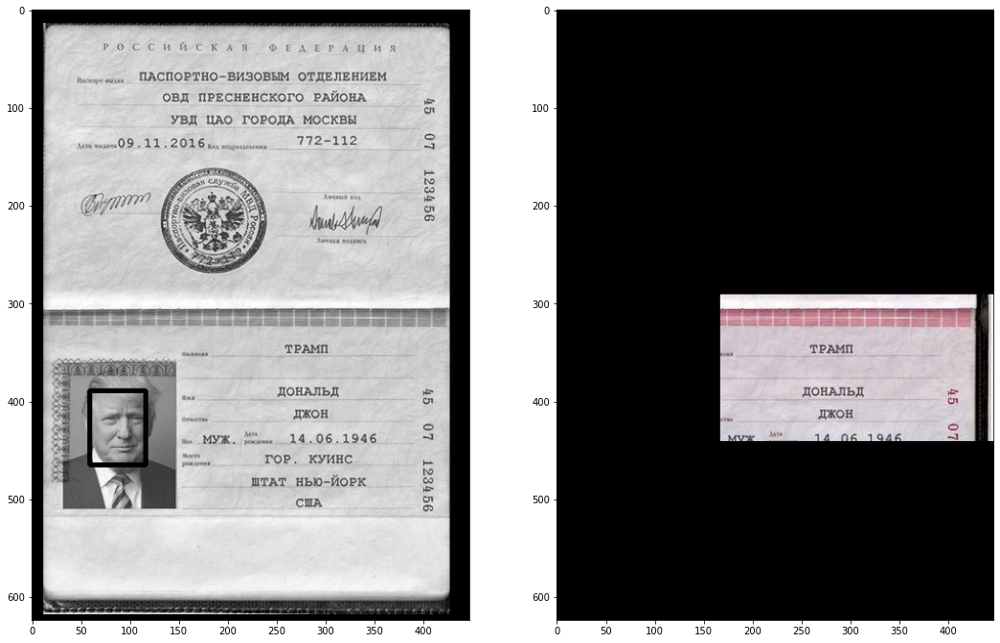

OK! answer= {'Фамилия': 'ТРАМП', 'Имя': 'ДОНАЛЬД', 'Отчество': 'ДЖОН'}
----------------------------------------
1/1 [==============================] - 0s 32ms/step


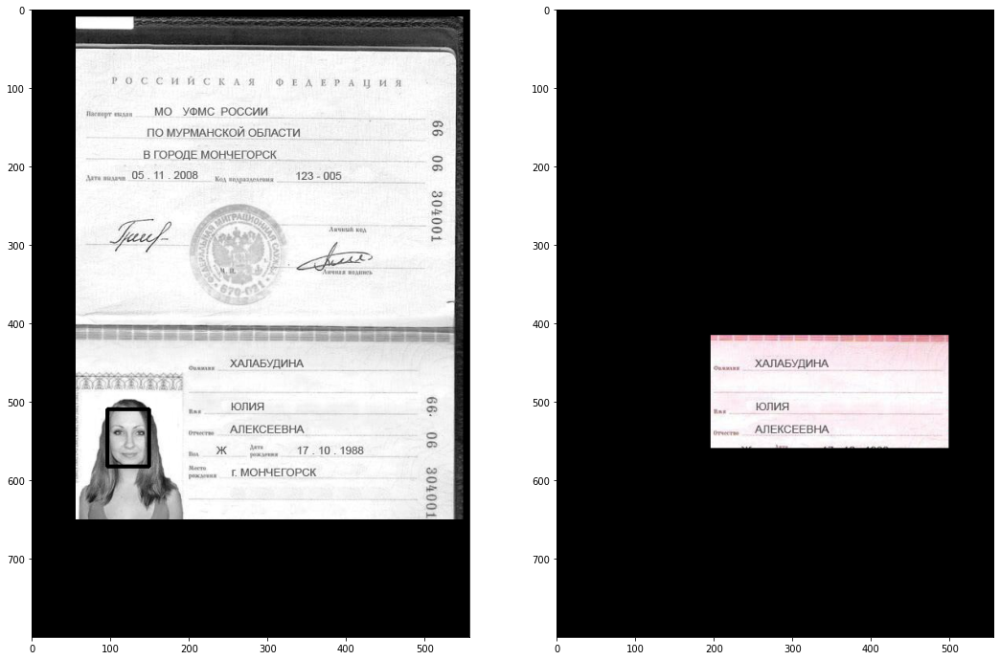

OK! answer= {'Фамилия': 'ХАЛАБУДИНА', 'Имя': 'ЮЛИЯ', 'Отчество': 'АЛЕКСЕЕВНА'}
----------------------------------------
1/1 [==============================] - 0s 35ms/step


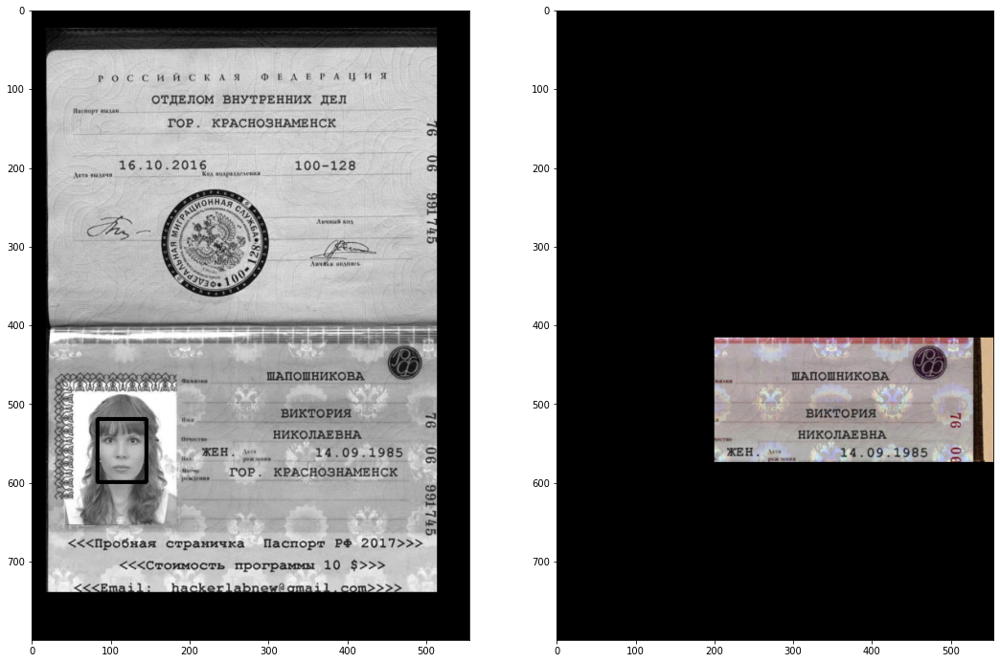

OK! answer= {'Фамилия': 'ШАПОШНИКОВА', 'Имя': 'ВИКТОРИЯ', 'Отчество': 'НИКОЛАЕВНА'}
----------------------------------------
1/1 [==============================] - 0s 29ms/step


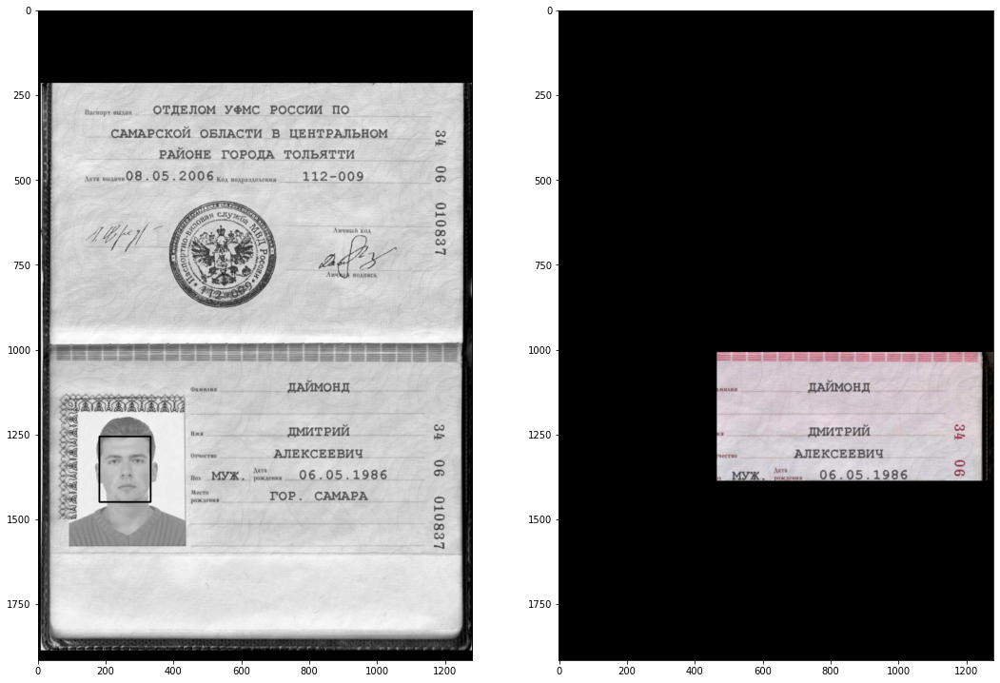

OK! answer= {'Фамилия': 'ДАЙМОНД', 'Имя': 'ДМИТРИЙ', 'Отчество': 'АЛЕКСЕЕВИЧ'}
----------------------------------------
1/1 [==============================] - 0s 28ms/step


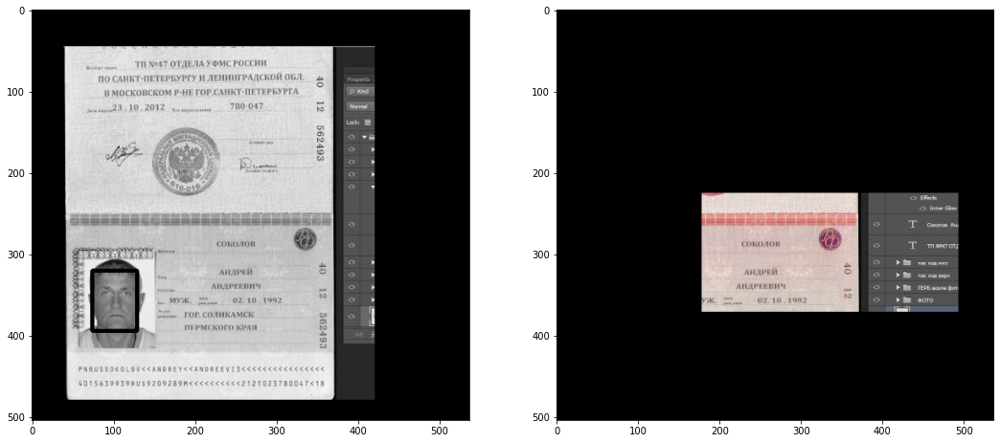

OK! answer= {'Фамилия': 'СОКОЛОВ', 'Имя': 'АНДРЕИ', 'Отчество': 'АНДРЕЕНИЧ'}
----------------------------------------
1/1 [==============================] - 0s 28ms/step


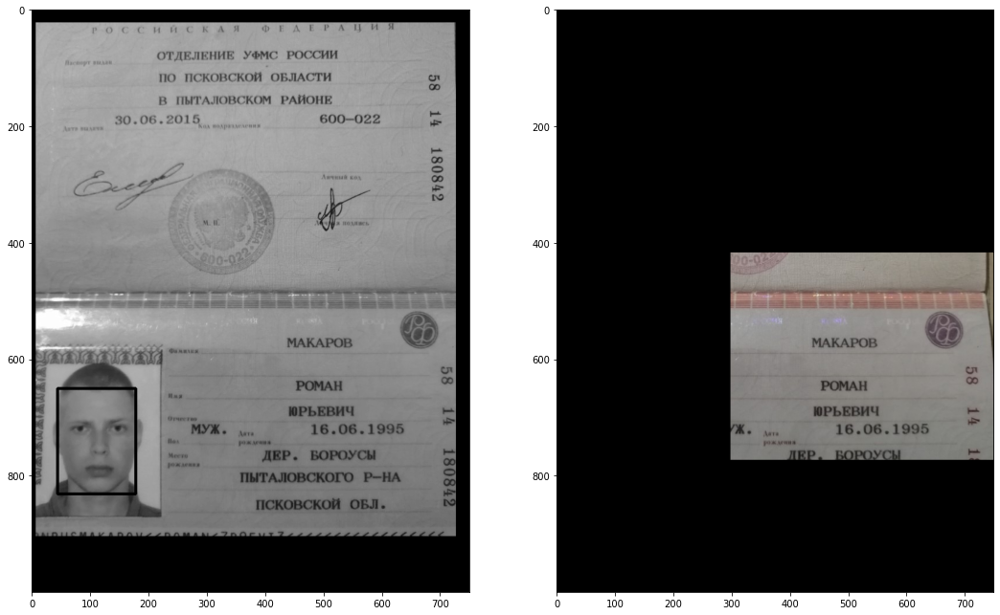

OK! answer= {'Фамилия': 'МАКАРОВ', 'Имя': 'РОМАН', 'Отчество': 'ЮРЬЕВИЧ'}
----------------------------------------
1/1 [==============================] - 0s 40ms/step


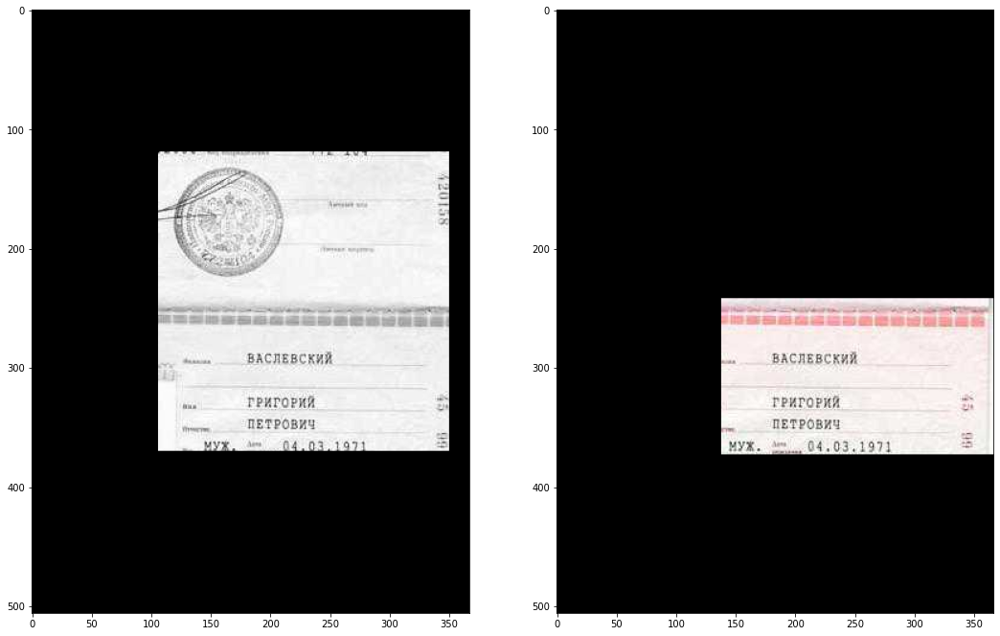

OK! answer= {'Фамилия': 'ВАСЛЕВСКИЯ', 'Имя': 'ГРКГОРЖЯ', 'Отчество': 'ПЕТРОВИЦ'}
----------------------------------------
1/1 [==============================] - 0s 49ms/step


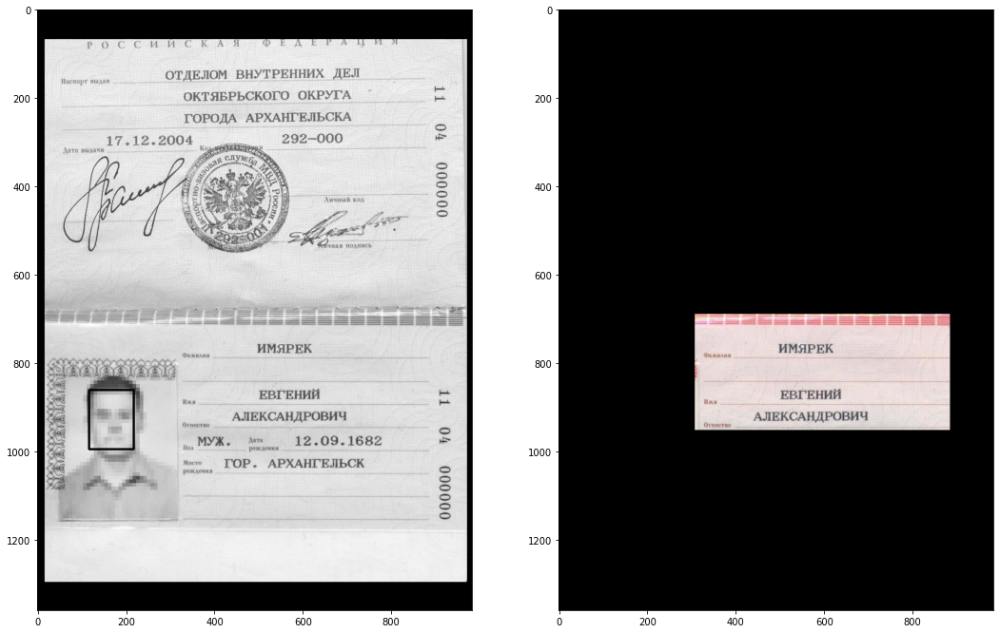

OK! answer= {'Фамилия': 'ИМЯРЕК', 'Имя': 'ЕВГЕНИЙ', 'Отчество': 'АЛЕКСАНДРОВИЧ'}
----------------------------------------
1/1 [==============================] - 0s 37ms/step


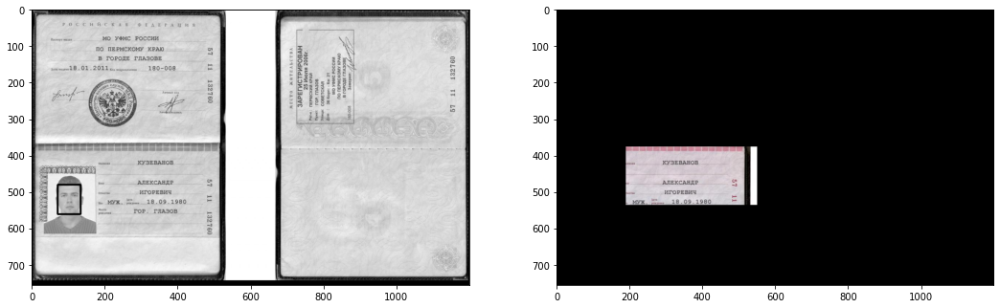

OK! answer= {'Фамилия': 'КУЗЕВАНОВ', 'Имя': 'АЛЕКСАНДР', 'Отчество': 'ИГОРЕВИЧ'}
----------------------------------------
1/1 [==============================] - 0s 58ms/step


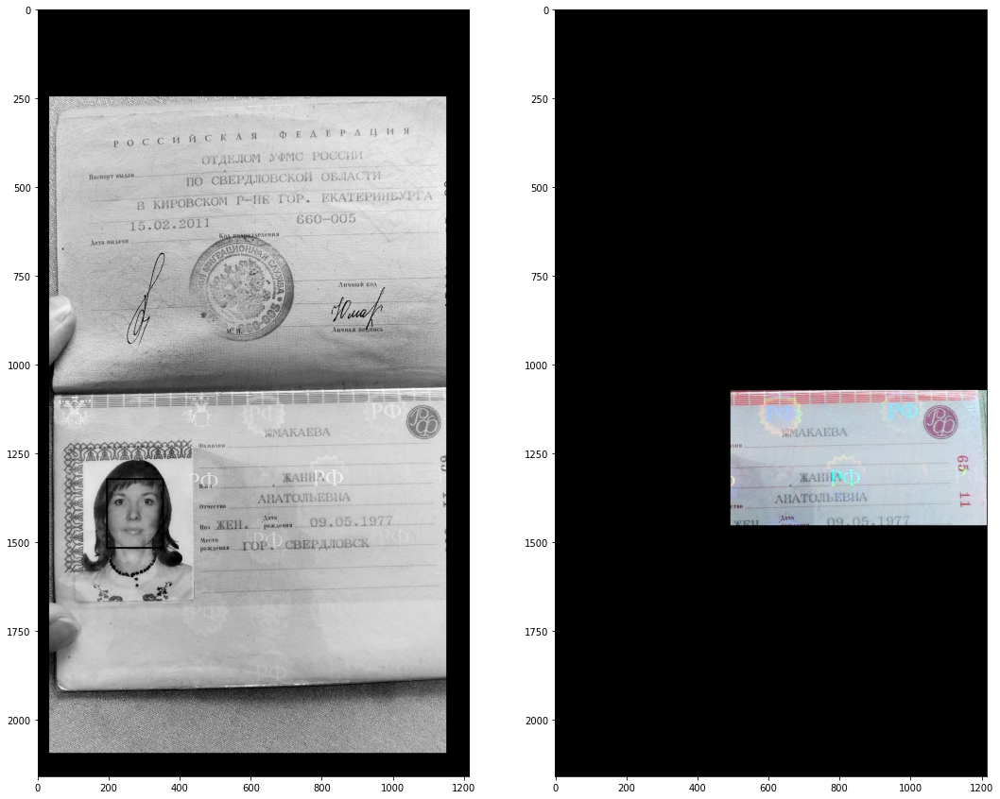

NameNotFoundError <> file_name, texts: 9.jpeg [([[589, 1109], [682, 1109], [682, 1170], [589, 1170]], '5а', 0.018480074415621446), ([[934, 1104], [1028, 1104], [1028, 1160], [934, 1160]], 'РФ', 0.9998688415268309), ([[629, 1173], [827, 1173], [827, 1209], [629, 1209]], 'ЗМАКАЕВА', 0.248599807484206), ([[497, 1223], [529, 1223], [529, 1237], [497, 1237]], 'лия', 0.9264630048042338), ([[1127, 1251], [1167, 1251], [1167, 1307], [1127, 1307]], 'с', 0.8324159104233786), ([[685, 1301], [777, 1301], [777, 1337], [685, 1337]], 'ЖАНН', 0.32086890935897827), ([[768, 1290], [866, 1290], [866, 1346], [768, 1346]], 'РРФ', 0.9841076592361885), ([[616, 1355], [883, 1355], [883, 1397], [616, 1397]], 'АНАТОЛЬЕВНА', 0.9804577381277528), ([[1135, 1353], [1173, 1353], [1173, 1407], [1135, 1407]], '6', 0.2684134907234501), ([[501, 1395], [531, 1395], [531, 1407], [501, 1407]], 'ТНО', 0.39160811318710864), ([[633, 1423], [675, 1423], [675, 1443], [633, 1443]], 'Дата', 0.9490910768508911), ([[830, 1423], [88

In [ ]:
for file_name in filenames:
    try:
        texts = convert_image2text(file_name)
        answer = get_text_result(texts, tr_conf=0.3)
        print("OK! answer=", answer)
    except NotFacesFoundError:
        print("Not found face --> aborted")
    except NameNotFoundError as e:
        print("NameNotFoundError <> file_name, texts:", file_name, texts)
    print("--" * 20)

Паспорта Васлевского, Юмакаевой и Соколова читаются плохо, с ошибками. Но порог уверенности модели в этом демонстрационном примере поставлен низким(0.3) - поэтому ошибка выскакивает только на Юмакаевой, остальные 2  прочитаны с опечатками.

## Своя модель распознавания

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [ ]:
# dataset from pdf

!cp /content/gdrive/MyDrive/Text_recognition/train_own_textes.zip train_own_textes.zip
!unzip -q train_own_textes.zip -d ./ 

In [ ]:
# old dataset

!cp /content/gdrive/MyDrive/Text_recognition/lines_w25.tar /content/lines_w25.tar
!tar -xf /content/lines_w25.tar 

In [ ]:
! cp /content/gdrive/MyDrive/Text_recognition/crnn_models.py /content/crnn_models.py
!ls -la

total 4587384
drwxr-xr-x 1 root root       4096 Jan  3 10:29 .
drwxr-xr-x 1 root root       4096 Jan  3 10:26 ..
-rw-r--r-- 1 root root      67982 Jan  3 10:28 0.jpeg
-rw-r--r-- 1 root root      70916 Jan  3 10:28 1.jpeg
-rw-r--r-- 1 root root     141920 Jan  3 10:28 2.jpeg
-rw-r--r-- 1 root root     307977 Jan  3 10:28 3.jpeg
-rw-r--r-- 1 root root     378499 Jan  3 10:28 4.png
-rw-r--r-- 1 root root     130360 Jan  3 10:28 5.jpeg
-rw-r--r-- 1 root root      19359 Jan  3 10:28 6.jpeg
-rw-r--r-- 1 root root     411303 Jan  3 10:28 7.jpeg
-rw-r--r-- 1 root root     129251 Jan  3 10:28 8.jpeg
-rw-r--r-- 1 root root    1377426 Jan  3 10:28 9.jpeg
drwxr-xr-x 4 root root       4096 Dec 20 20:18 .config
-rw------- 1 root root      21812 Jan  3 10:51 crnn_models.py
-rw-r--r-- 1 root root       1867 Jan  3 10:35 current.png
drwx------ 5 root root       4096 Jan  3 10:27 gdrive
drwxrwxr-x 2 1000 1000   49242112 Dec 18 19:20 lines_w25
-rw------- 1 root root  647096320 Jan  3 10:51 lines_w25.tar


In [ ]:
#model
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data_utils
import torch
from tqdm import tqdm, tqdm_notebook
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from crnn_models import CRNN, CRNN2, CRNN3, ImgTextData, ImgTextUpperData, train, test
from torchsummary import summary

# general
import cv2
import os
import string
import numpy as np
from collections import Counter
import importlib

import matplotlib.pyplot as plt

%matplotlib inline

In [ ]:
txt_files = []
png_files = []
others = []

data_dir = '/content/lines_w25/'

for file_name in os.listdir(data_dir):
    if file_name.endswith('.txt'):
        txt_files.append(file_name)
    elif file_name.endswith('.png'):
        png_files.append(file_name)
    else:
        txt_files.append(file_name)

print([len(x) for x in (txt_files, png_files, others)])
assert len(txt_files) == len(png_files)
print(len(txt_files), len(set(txt_files)))
assert len(txt_files) == len(set(txt_files))
txt_files.sort()
png_files.sort()

print(", ".join(txt_files[:10]))
print(", ".join(png_files[:10]))


[613548, 613548, 0]
613548 613548
0_a.gt.txt, 0_b.gt.txt, 100000_a.gt.txt, 100000_b.gt.txt, 10000_a.gt.txt, 10000_b.gt.txt, 10001_a.gt.txt, 10001_b.gt.txt, 10002_a.gt.txt, 10002_b.gt.txt
0_a.png, 0_b.png, 100000_a.png, 100000_b.png, 10000_a.png, 10000_b.png, 10001_a.png, 10001_b.png, 10002_a.png, 10002_b.png


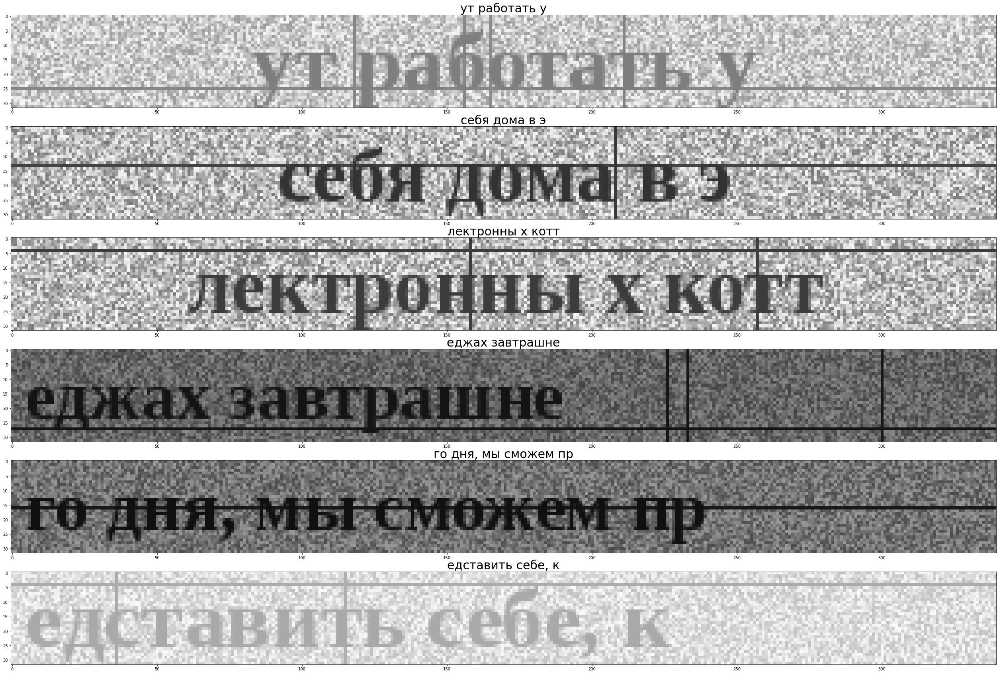

In [ ]:
n = 6
labels = []
bias = 150000

fig, ax = plt.subplots(n, 1, figsize=(15 * n, 30))
for jj in range(n):
    j = jj + bias
    img = cv2.imread(data_dir + png_files[j], 0)
    ax[jj].imshow(img, cmap='gray', vmin=0, vmax=255)

    with open(data_dir + txt_files[j]) as f:
        txt = f.read().strip()
        labels.append((png_files[j], txt_files[j], img.shape, txt))
    ax[jj].set_title(txt, fontdict={'fontsize': 30})

plt.show()

In [ ]:
total_chars = Counter()
uniq_lengths, uniq_shape = {}, {}
equal_begin = 0
MEAN = 0
STD = 0

zero_lengths = []

for j, file_name in enumerate(txt_files):
    beg = file_name.split('.')[0]
    img_name = png_files[j]
    equal_begin += img_name.startswith(beg + '.')
    img = cv2.imread(data_dir + img_name, 0)
    # img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
    # uniq_shape[img.shape] = uniq_shape.get(img.shape, 0) + 1
    img = transforms.ToTensor()(img)
    MEAN += img.mean()
    STD += img.std()

    # with open(data_dir + file_name) as f:
    #     txt = f.read().strip()                              
    # uniq_lengths[len(txt)] = uniq_lengths.get(len(txt), 0) + 1
    # if len(txt) <= 1:
    #     zero_lengths.append(file_name)

    # words= txt.split()
    # total_chars.update(list(txt))

MEAN /= len(txt_files)
STD /= len(txt_files)
MEAN, STD  

(tensor(0.6759), tensor(0.1597))

Нет четкой уверенности, что лучше, поэтому для целей задачи модели OCR обучаются в 2-х вариантах:
- CHARS_ALL : нижний и верхний регистры, загрузчик текстов и изображений - стандартный;
- CHARS_UPPER : на изображениях символы в обоих регистрах, но в текстах только один регистр (верхний), загрузчик переводит все тексты в верхний регистр.
В первом случае 93 класса, во втором -60, к обоим добавляется еще 1 пустой.

In [ ]:
LETTERS_KIND = "UPPER"

IMG_H, IMG_W = (32, 340)
MEAN_IMG = 0.679 
STD_IMG = 0.1622
BLANK = 0
SEED = 0
CHARS_ALL = ' !"()*,-.0123456789:№;<>?[]ЁАБВГДЕЖЗИЙКЛМНОПРСТУФХЦЧШЩЪЫЬЭЮЯабвгдежзийклмнопрстуфхцчшщъыьэюяё'
CHARS_UPPER = ' !"()*,-.0123456789:№;<>?[]ЁАБВГДЕЖЗИЙКЛМНОПРСТУФХЦЧШЩЪЫЬЭЮЯ'

CHARS = {"ALL": CHARS_ALL, "UPPER": CHARS_UPPER}.get(LETTERS_KIND)
MyDataset = {"ALL": ImgTextData, "UPPER": ImgTextUpperData}.get(LETTERS_KIND)

DEVICE = torch.device('cuda') if torch.cuda.is_available() else 'cpu'
if not torch.cuda.is_available():
    print("А где же ГПУ?")

print("CHARS:", CHARS)

А где же ГПУ?
CHARS:  !"()*,-.0123456789:№;<>?[]ЁАБВГДЕЖЗИЙКЛМНОПРСТУФХЦЧШЩЪЫЬЭЮЯ


In [ ]:
!nvidia-smi  # -L

Tue Jan  3 07:16:54 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P0    25W /  70W |      3MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
print(len(txt_files), len(png_files))
png_files.sort()
txt_files.sort()

indexes = np.arange(len(txt_files))
np.random.seed(SEED)
np.random.shuffle(indexes)

val_len = test_len = int(len(txt_files) * 0.15)

train_txt = [txt_files[j] for j in indexes[test_len + val_len:]]
train_png = [png_files[j] for j in indexes[test_len + val_len:]]

val_txt = [txt_files[j] for j in indexes[test_len: test_len + val_len]]
val_png = [png_files[j] for j in indexes[test_len: test_len + val_len]]

test_txt = [txt_files[j] for j in indexes[: test_len]]
test_png = [png_files[j] for j in indexes[: test_len]]

train_dataset = MyDataset(data_dir, train_txt, train_png, CHARS, mode='train')
val_dataset = MyDataset(data_dir, val_txt, val_png, CHARS, mode='val')
# test_dataset will be loaded in memory after training to reduse memory usage

613548 613548


In [ ]:
list(map(len, (train_txt, train_png, val_txt, val_png)))

[429484, 429484, 92032, 92032]

### Train, load

torch.Size([1, 32, 340]) tensor(0.1020) tensor(0.3726) tensor(0.4706)
torch.Size([32, 25]) tensor([46, 40, 34, 33, 48, 34, 47,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0])
torch.Size([32, 1]) tensor([7], dtype=torch.int32)


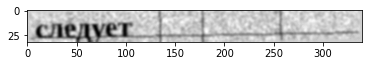

In [ ]:
batch_train = 32
test_dataset = test_loader = 0

train_loader = DataLoader(train_dataset, batch_size=batch_train, shuffle=True, drop_last=True)
val_loader = DataLoader(val_dataset, batch_size=64, drop_last=True)

x, y, targ_lengths = next(iter(train_loader))  # images, labels, targ_lengths
im = x[0]
print(im.shape, im.min(), im.mean(), im.max())
print(y.shape, y[0])
print(targ_lengths.shape, targ_lengths[0])
plt.imshow(im.squeeze(0), cmap='gray')
plt.show()

In [ ]:
model_version = 3  # (1, 2, 3)

g_drive_dir = '/content/gdrive/MyDrive/Text_recognition/'
results = dict(train_acc=[], val_acc=[], train_loss=[], val_loss=[], lr=[])
model_kwargs = dict(chars=CHARS, blank=BLANK, img_h=IMG_H, img_w=IMG_W, 
                    					gru_hidden_size=128, gru_num_layers=2)
models = {1: CRNN(**model_kwargs),
		  2: CRNN2(**model_kwargs, dropout=0.35),
		  3: CRNN3(**model_kwargs)}
model_pathes = {1: 'model.pth', 2: 'model_crn2.pth', 3: 'model_crn3.pth'}

model = models[model_version].to(DEVICE)
path = g_drive_dir + model_pathes[model_version]
print("num_classes=", model.num_classes, "; model_version=", model_version)

# z = torch.Tensor(np.zeros((32, 340))).unsqueeze(0).unsqueeze(0).to(DEVICE)
# outp = model(z)
# print("outp.shape:", outp.shape, "model.gru_input_size:", model.gru_input_size)
# summary(model, z.squeeze(0).shape)

num_classes= 61 ; model_version= 3


In [ ]:
# Train w/ scheduler
lr = 0.0006
epochs = 25
n_patience = 5
optimizer = optim.AdamW(model.parameters(), lr)
scheduler = optim.lr_scheduler.OneCycleLR(optimizer,
										  max_lr=lr,
									  	  steps_per_epoch=len(train_loader),
										  epochs=epochs,
										  anneal_strategy='linear'
										  )

train(model, epochs, results, scheduler, optimizer, train_loader, val_loader, n_patience, path)

before 1 epoch: lr= 2.3999999999999997e-05


100%|██████████| 1438/1438 [00:41<00:00, 34.45it/s]


epoh=  1, train_acc=0.314, val_acc=0.895 || train_loss= 1.7299, val_loss= 0.0612
before 2 epoch: lr= 0.0001008007629909643


100%|██████████| 1438/1438 [00:43<00:00, 33.11it/s]


epoh=  2, train_acc=0.803, val_acc=0.941 || train_loss= 0.0815, val_loss= 0.0373
before 3 epoch: lr= 0.00017760152598192858


100%|██████████| 1438/1438 [00:43<00:00, 33.33it/s]


epoh=  3, train_acc=0.872, val_acc=0.946 || train_loss= 0.0526, val_loss= 0.0318
before 4 epoch: lr= 0.0002544022889728929


100%|██████████| 1438/1438 [00:41<00:00, 34.57it/s]


epoh=  4, train_acc=0.898, val_acc=0.949 || train_loss= 0.0422, val_loss= 0.0297
before 5 epoch: lr= 0.0003312030519638572


100%|██████████| 1438/1438 [00:41<00:00, 34.45it/s]


epoh=  5, train_acc=0.911, val_acc=0.954 || train_loss= 0.0374, val_loss= 0.0286
before 6 epoch: lr= 0.0004080038149548215


100%|██████████| 1438/1438 [00:43<00:00, 33.34it/s]


epoh=  6, train_acc=0.917, val_acc=0.958 || train_loss= 0.0351, val_loss= 0.0258
before 7 epoch: lr= 0.0004848045779457858


100%|██████████| 1438/1438 [00:42<00:00, 33.97it/s]


epoh=  7, train_acc=0.922, val_acc=0.959 || train_loss= 0.0334, val_loss= 0.0261
before 8 epoch: lr= 0.0005616053409367501


100%|██████████| 1438/1438 [00:41<00:00, 34.65it/s]


epoh=  8, train_acc=0.924, val_acc=0.961 || train_loss= 0.0324, val_loss= 0.0249
before 9 epoch: lr= 0.000582854656806923


100%|██████████| 1438/1438 [00:42<00:00, 34.23it/s]


epoh=  9, train_acc=0.929, val_acc=0.962 || train_loss= 0.0304, val_loss= 0.0247
before 10 epoch: lr= 0.0005485690796640659


100%|██████████| 1438/1438 [00:41<00:00, 34.48it/s]


epoh= 10, train_acc=0.934, val_acc=0.961 || train_loss= 0.0288, val_loss= 0.0239
before 11 epoch: lr= 0.0005142835025212087


 26%|██▋       | 3550/13421 [04:24<12:13, 13.45it/s]

In [ ]:
!cp /content/gdrive/MyDrive/Text_recognition/model.pth /content/model.pth
!cp /content/gdrive/MyDrive/Text_recognition/model_crn2.pth /content/model_crn2.pth
!cp /content/gdrive/MyDrive/Text_recognition/model_crn3.pth /content/model_crn3.pth


In [ ]:
pathes_to_load = {1: '/content/model.pth',
                  2: '/content/model_crn2.pth',
                  3: '/content/model_crn3.pth'}

model.load_state_dict(torch.load(pathes_to_load[model_version]))
model = model.to(DEVICE)
print(f"model_version= {model_version}, loaded")

model_version= 3, loaded


In [ ]:
lr = 0.000003  # 0.000001 #0.00001 # 0.00003
epochs= 3
scheduler = None
n_patience = 5
optimizer = optim.AdamW(model.parameters(), lr)
train(model, epochs, results, scheduler, optimizer, train_loader, val_loader, n_patience, path)

before 1 epoch: lr= 3e-06


100%|██████████| 1438/1438 [00:43<00:00, 33.25it/s]


epoh=  1, train_acc=0.958, val_acc=0.966 || train_loss= 0.0198, val_loss= 0.0205
before 2 epoch: lr= 3e-06


100%|██████████| 1438/1438 [00:44<00:00, 32.58it/s]


epoh=  2, train_acc=0.957, val_acc=0.966 || train_loss= 0.0199, val_loss= 0.0204
before 3 epoch: lr= 3e-06


100%|██████████| 1438/1438 [00:42<00:00, 33.74it/s]

epoh=  3, train_acc=0.958, val_acc=0.966 || train_loss= 0.0196, val_loss= 0.0204


In [ ]:
print(f"{model_version=}")
for k, v in results.items():
    print(k, v)

model_version=3
train_acc [0.9427483048953134, 0.9449579949333134, 0.9458660867297519, 0.9536780046196259, 0.955806199239997, 0.9567981148945682, 0.9575641718202816, 0.9573406415319275, 0.9577667461441025]
val_acc [0.9642841620305981, 0.9614481919332406, 0.9634800938803895, 0.9648057197496523, 0.9658379694019471, 0.9656749826147427, 0.9658379694019471, 0.9660009561891516, 0.9660009561891516]
train_loss [0.025523450322292883, 0.024467209766113433, 0.024105727426420108, 0.02140906799339347, 0.020520631947207966, 0.02017250644057472, 0.01975450832151531, 0.019873579939490165, 0.019647911837001243]
val_loss [0.022372045630947118, 0.022636898879114162, 0.02205001860523672, 0.02103023144059554, 0.020660567141244233, 0.020571110867203413, 0.020489737021506114, 0.020432347592614003, 0.020422601143504727]
lr [0.0003, 0.0003, 0.0003, 3e-05, 3e-05, 3e-05, 3e-06, 3e-06, 3e-06]


In [ ]:
lr = 0.0000003  # 0.000001 #0.00001 # 0.00003 || model1, model3: last lr=0.0001 (3epochs, 2epochs//)
epochs= 3
scheduler = None
n_patience = 5
optimizer = optim.AdamW(model.parameters(), lr)
train(model, epochs, results, scheduler, optimizer, train_loader, val_loader, n_patience, path)
# 

before 1 epoch: lr= 3e-07


 86%|████████▌ | 11550/13421 [15:01<02:34, 12.11it/s]

### test

In [ ]:
train_dataset = val_dataset = 0  # clear memory
test_dataset = MyDataset(data_dir, test_txt, test_png, CHARS, mode='val')
test_loader = DataLoader(test_dataset, batch_size=256, drop_last=True)
test(model, test_loader) 

100%|██████████| 359/359 [30:46<00:00,  5.14s/it]


test_accuracy: 0.9655


In [ ]:
# sample predictions and compare with original text
t_loader = iter(test_loader)

x, y, ln_targ = next(t_loader)                                    
text_predictions, conf = model.predict_text(x.to(DEVICE))
mistakes = []
n = 10
print(f"############## correct predictions in first {n} examples")

for j, txt_pred in  enumerate(text_predictions):
    txt_orig = ''.join([CHARS[d - 1] for d in y[j].tolist() if d > 0])
    if txt_pred != txt_orig:
        mistakes.append((txt_orig, txt_pred))
    elif j < n:
        print(txt_pred, '||', txt_orig, '\t\t', " ; confidence=", round(conf[j], 4))

if mistakes:
    print("\n########################## Mistakes ##############\n")
    for txt_orig, txt_pred in mistakes:
        print(f'"{txt_pred}" <vs> "{txt_orig}" \t\t\t; confidence= {conf[j]:.4f}')

############## correct predictions in first 10 examples
ЫЙ ЯЗЫК || ЫЙ ЯЗЫК 		  ; confidence= 0.9468
ПРОГРА || ПРОГРА 		  ; confidence= 0.5303
ЖДАЛИ, ХУД ВЕРНУЛ || ЖДАЛИ, ХУД ВЕРНУЛ 		  ; confidence= 0.5695
РУБ. ГЛАВА "РОСНЕФТЬ" ИГО || РУБ. ГЛАВА "РОСНЕФТЬ" ИГО 		  ; confidence= 0.6035
ТСЯ || ТСЯ 		  ; confidence= 0.5979
ЛИНДРИЧЕСКИЙ ПРЕДМЕТ, КОТ || ЛИНДРИЧЕСКИЙ ПРЕДМЕТ, КОТ 		  ; confidence= 0.5184
Ь БЫ ХОТЕТЬ, ЧТОБЫ ОН ПОС || Ь БЫ ХОТЕТЬ, ЧТОБЫ ОН ПОС 		  ; confidence= 0.5315
АЛЬН || АЛЬН 		  ; confidence= 0.7451
ЛЬ. ТЕАТР БЫТЬ ПОЛНОСТЬЮ || ЛЬ. ТЕАТР БЫТЬ ПОЛНОСТЬЮ 		  ; confidence= 0.7221

########################## Mistakes ##############

"И ФИЛЬМОВ ОБЕСПЕС" <vs> "И ФИЛЬМОВ ОБЕСПЕЧ" 			; confidence= 0.5140
"ЦИЯ. СЛОЖНОСТИ С ВЫ" <vs> "ЦИЯ. СЛОЖНОСТИ С ВЫЗОВ" 			; confidence= 0.5140
"ОБИТСЯ, ОНИ БУДУТ С" <vs> "ОБИТСЯ, ОНИ БУДУТ СР" 			; confidence= 0.5140
"РАЛЬНОГО ПОРОШКА" <vs> "РАЛЬНОГО ПОРОШКА И Т" 			; confidence= 0.5140
"НКОВСКОЙ СИСТЕМЫ " <vs> "БАНКОВСКОЙ СИСТЕМЫ В В" 			; conf

## Совмещение встроенного детектора и обученного recognizer.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [ ]:
! cp /content/gdrive/MyDrive/Text_recognition/crnn_models.py /content/crnn_models.py
!ls -la

total 262564
drwxr-xr-x 1 root root      4096 Jan  3 10:27 .
drwxr-xr-x 1 root root      4096 Jan  3 10:26 ..
drwxr-xr-x 4 root root      4096 Dec 20 20:18 .config
-rw------- 1 root root     21812 Jan  3 10:27 crnn_models.py
drwx------ 5 root root      4096 Jan  3 10:27 gdrive
drwx------ 2 root root   1953792 Jan  3 10:27 lines_w25
-rw------- 1 root root 165675008 Jan  3 10:27 lines_w25.tar
drwxr-xr-x 1 root root      4096 Dec 20 20:19 sample_data
-rw------- 1 root root 101187584 Jan  3 10:27 train_own_textes.zip


In [ ]:
!pip install opencv-rolling-ball
!pip install mtcnn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for opencv-rolling-ball: filename=opencv_rolling_ball-1.0.1-py3-none-any.whl size=6895 sha256=ad1aa583324670f5f705206313fa04007ea0a2f344f38d405c806e4a7708b0a0
  Stored in directory: /root/.cache/pip/wheels/30/6e/46/2176c00920c9cdde3e4c2ee98d657f3c7e596318bf0564b979
Successfully built opencv-rolling-ball
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.3 MB 5.3 MB/s 


In [ ]:
!pip install easyocr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.9 MB 5.0 MB/s 
     |████████████████████████████████| 619 kB 63.8 MB/s 
     |████████████████████████████████| 47.6 MB 1.2 MB/s 
     |████████████████████████████████| 145 kB 49.5 MB/s 
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.6.0.66
    Uninstalling opencv-python-headless-4.6.0.66:
      Successfully uninstalled opencv-python-headless-4.6.0.66


In [ ]:
import torch.nn as nn
import torch.nn.functional as F
import torch
from torchvision import transforms
from crnn_models import CRNN, CRNN2, CRNN3

import easyocr
import cv2
from cv2_rolling_ball import subtract_background_rolling_ball
from mtcnn import MTCNN
import os
import string
import numpy as np
from collections import Counter
import matplotlib.pyplot as plt
from functools import reduce

%matplotlib inline

А где же ГПУ?


In [ ]:
IMG_H, IMG_W = (32, 340)
MEAN_IMG = 0.679 
STD_IMG = 0.1622
BLANK = 0
CURRENT = "current.png"

CHARS_ALL = ' !"()*,-.0123456789:№;<>?[]ЁАБВГДЕЖЗИЙКЛМНОПРСТУФХЦЧШЩЪЫЬЭЮЯабвгдежзийклмнопрстуфхцчшщъыьэюяё'
CHARS_UPPER = ' !"()*,-.0123456789:№;<>?[]ЁАБВГДЕЖЗИЙКЛМНОПРСТУФХЦЧШЩЪЫЬЭЮЯ'


class NotFacesFoundError(Exception):
    pass

class NameNotFoundError(Exception):
    pass

In [ ]:
filenames = []
for filename in sorted(os.listdir(os.getcwd())):
    if filename.endswith('.jpeg') or filename.endswith('.png') and filename != CURRENT:
        filenames.append(filename)
", ".join(filenames)

'0.jpeg, 1.jpeg, 2.jpeg, 3.jpeg, 4.png, 5.jpeg, 6.jpeg, 7.jpeg, 8.jpeg, 9.jpeg'

In [ ]:
class PassportReaderSimple:
    def __init__(self, face_detector, text_recognizers, temp_file=CURRENT,
                 denoiser=None, erode_kernel=(1, 2), dilate_kernel=(5, 5), 
                 tr_conf=0.5, dilate_iterations=1, add_margin=5, show_boxes=True,
                 verbose=False, min_size=0.08):
        self.face_detector = face_detector
        self.text_recognizers = text_recognizers
        self.temp_file = temp_file
        self.erode_kernel = erode_kernel
        self.dilate_kernel = dilate_kernel
        self._init_data()
        self.tr_conf = tr_conf
        self.dilate_iterations = dilate_iterations
        self.add_margin = add_margin 
        self._denoisers = ('billateral', 'rolling_boll', 'gaussian', None)      # 'nlmeans' -not good
        assert denoiser in self._denoisers
        self._denoiser = denoiser
        self.show_boxes = show_boxes
        self.verbose = verbose

    def _init_data(self):
        self._data = dict()

    def _get_rectangle(self, img, x, y, x2, y2):
        return img[y: y2, x: x2]

    def _save_rectangle(self, img, x, y, x2, y2):
        cv2.imwrite(self.temp_file, self._get_rectangle(img, x, y, x2, y2))

    def _apply_denoiser(self, img, denoiser):  # for grid_serch we send denoiser as parameter
        if 'rolling_boll' == denoiser:
            img, _ = subtract_background_rolling_ball(img, 30, light_background=True, use_paraboloid=False, do_presmooth=True)
            return img
        elif 'gaussian' == denoiser:
            return cv2.GaussianBlur(img, (9, 9), 0, cv2.BORDER_CONSTANT)
        elif 'billateral' == denoiser:
            ret, _ = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            return cv2.bilateralFilter(img, 3, int(0.1 * ret), max(1.3 * ret, 100))
        return img

    def _get_border_coord(self, im):
        corners = np.uint0(cv2.goodFeaturesToTrack(im, 20, 0.05, 200))
        corners = [corner.ravel() for corner in corners]
        x = [corner[0] for corner in corners]
        y = [corner[1] for corner in corners]
        x1, y1, x2, y2 = list(map(int, (min(x), min(y), max(x), max(y))))
        if (x2 - x1) > 0.7 * (y2 - y1):
            x2 = int(0.7 * (y2 - y1)) + x1
        elif (x2 - x1) < 0.63 * (y2 - y1):
            y2 = int(1.5 * (x2 - x1)) + y1
        return x1, y1, x2 + 1, y2 + 1

    def _get_face_coord(self, im_bgr):
        im_rgb = cv2.cvtColor(im_bgr, cv2.COLOR_BGR2RGB)
        res = self.face_detector.detect_faces(im_rgb)
        items = sorted([(item['confidence'], item['box']) for item in res])
        if items and items[-1][0] > 0.75:                                       # conf, face_coord = items[-1]
            return items[-1][-1]
        raise NotFacesFoundError(items) 

    def _compute_target_coord(self, img_c):
        "find target box coordinates from face coordinates"
        x_min, y_min, x_max, y_max = self._data["extra_coord"]      
        x, y, w, h = self._get_face_coord(img_c)                          # NotFacesFoundError!!
        self._data["face_coord"] = x - x_min, y - y_min, w, h             # shifted by border (we cut border)
        x1 = x + int(2 * w) - x_min
        y1 = y - int(1.2 * h) - y_min     
        x2 = x  + int(7.6 * w) - x_min
        y2 = y + int(0.64 * h) - y_min 
        return x1, y1, x2, y2

    def _get_name_result(self, boxes):
        keys = ("Фамилия", "Имя", "Отчество")
        boxes_with_text = []
        answer = {}
        
        for key, box in zip(keys, boxes):
            x, y, w, h = box[:4]
            x1 = max(0, x - self.add_margin) 
            y1 = max(0, y - self.add_margin)
            x2 = x + w + self.add_margin
            y2 = y + h + self.add_margin
            self._save_rectangle(self._data["crop_image"], x1, y1, x2, y2)
            res = [recognizer.recognize(self.temp_file) for recognizer 
                                                       in self.text_recognizers]
            if self.verbose:
                [print(f"{key}: {text}\t\t; confidence_model= {confidence}") 
                                                    for text, confidence in res]
            res.sort(key=lambda x: x[1])
            answer[key] = res[-1][0].upper()
            boxes_with_text.append((x, y, w, h, *res[-1]))
        return boxes_with_text, answer

    def _erode_dilate(self, im_not):
        if self.erode_kernel:
            kernel = np.ones(self.erode_kernel, np.uint8)
            im_not = cv2.erode(im_not, kernel, iterations=1)
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, self.dilate_kernel)
        return cv2.dilate(im_not, kernel, iterations=self.dilate_iterations)

    def text_boxes_detector(self):
        img = self._data["crop_image"].copy()
        img = self._apply_denoiser(img, self._denoiser)
        ##### find contours for blocks with text variatn1: #####################
        # out = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1] 
        # median = np.median(out)
        # lower = max(0, int(0.8 * median))
        # upper = min(255, int(1.2 * median))
        # out = cv2.Canny(out, lower, upper)                                            
        # contours, hierarchy = cv2.findContours(out, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
        ##### variatn 2:######################################################## 
        im_not = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                                 cv2.THRESH_BINARY_INV, 15, 9)    
        out = self._erode_dilate(im_not)        
        contours, hierarchy = cv2.findContours(out, cv2.RETR_EXTERNAL,
                                                    cv2.CHAIN_APPROX_NONE)
        ###### END variant #####################################################
        self._data["cann"] = out
        # select contours by hierarhy and target_box`s coordinates
        return [cv2.boundingRect(cnt) for cnt, hr in 
                                   zip(contours, hierarchy[0]) if hr[-1] == -1]
        
    def _test_box_coord(self, x, y, w, h, W, H):
        # if not (w > h and (w < 0.95 * W) and (H * 0.075 < h < 0.27 * H) 
        #                                  and (x < W / 2 < x + 2.8 * w)):
        #     print(f"H * 0.075 < h < 0.27 * H :, {H * 0.075 < h < 0.27 * H}, x= {x}, y= {y}, w= {w}, h={h}, (W, H)= {W, H}")
        #     print(f"x < W / 2 < x + 2.8 * w :, {x < W / 2 < x + 2.8 * w}, x= {x}, y= {y}, w= {w}, h={h}, (W, H)= {W, H}")
        #     print("--" * 20)
        return (w > h and (w < 0.96 * W) and (H * 0.075 < h < 0.27 * H) 
                                         and (x < W / 2 < x + 2.8 * w))

    def filter_boxes1(self, boxes):
        H, W = self._data["crop_image"].shape
        return [box for box in boxes if self._test_box_coord(*box, W, H)]   

    def filter_boxes2(self, boxes):
        tr = sorted([(h, x + w / 2) for x, y, w, h, *_ in boxes], reverse=True) # (h, x_center) for box
        tr_h = tr[2][0] * 0.7                                                   # tr sorted by h
        tr_w = int(sum([x_center for h, x_center in tr][:3]) / 3)               # tr sorted by h
        boxes = [box for box in boxes if box[3] > tr_h 
                    and (tr_w - 1.5 * box[2] < box[0] < tr_w + 2 * box[2])]
        boxes = sorted(boxes, key=lambda box: box[3])[:6]                       # ("h" по возрастанию)
        return sorted(boxes, key=lambda box: box[1])                            # "Y" по возрастанию            

    def get_name_from_image(self, image_file):
        img_color = cv2.imread(image_file)
        # 0. store gray_image / delete border
        im = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
        self._data["extra_coord"] = self._get_border_coord(im)
        self._data["img"] = self._get_rectangle(im, *self._data["extra_coord"])
        # 1. precompute target coordinates for box with name
        self._data["target_box_coord"] = self._compute_target_coord(img_color)
        # 1.1.store target box(crop)
        self._data["crop_image"] = self._get_rectangle(self._data["img"], 
                                              *self._data["target_box_coord"])
        # 2. detect rectangles with text and filter
        t_boxes = self.text_boxes_detector()
        t_boxes = self.filter_boxes1(t_boxes)
        if len(t_boxes) < 3:
            print("t_boxes:", t_boxes)
            raise  NameNotFoundError
        t_boxes = self.filter_boxes2(t_boxes) 
        # 2.1  recognize text                               
        text_boxes, answer = self._get_name_result(t_boxes)
        # if len(answer) < 3:
        #     raise NameNotFoundError

        if self.show_boxes:
            self._plot_result(text_boxes)

        self._init_data()
        return answer

    def _plot_result(self, boxes):
        img = self._data["img"]
        x, y, w, h = self._data["face_coord"]
        cv2.rectangle(img, (x, y), (x + w, y + h), 0, 2)

        crop = self._data["crop_image"]
        for x, y, w, h, _, _ in boxes:
            cv2.rectangle(crop, (x, y), (x + w, y + h), 0, 2)

        fig, ax = plt.subplots(1, 3, figsize=(18, 20))
        ax[0].imshow(img, cmap='gray', vmin=0, vmax=255)
        ax[1].imshow(crop, cmap='gray', vmin=0, vmax=255)
        ax[2].imshow(self._data["cann"], cmap='gray', vmin=0, vmax=255)
        plt.show()


In [ ]:
class PassportReader2(PassportReaderSimple):
    "Класс тестовый для сопоставления резудьтатов EAYSY_OCR с результатами обученных сеток"
    def __init__(self, face_detector, text_recognizers, text_detector, 
                 temp_file=CURRENT, tr_conf=0.3, show_boxes=True,
                 verbose=False, add_margin=0.2, min_size=15):
        self.face_detector = face_detector
        self.text_recognizers = text_recognizers
        self.text_detector = text_detector
        self.temp_file = temp_file
        self.tr_conf = tr_conf
        self.add_margin=0.5
        self._init_data()
        # self._denoisers = ('billateral', 'rolling_boll', 'gaussian', None)      # 'nlmeans' -not good
        # assert denoiser in self._denoisers
        # self._denoiser = denoiser
        self.show_boxes = show_boxes
        self.verbose = verbose
        self.min_size = min_size

    def filter_boxes1(self, text_boxes):
        res = []
        H, W = self._data["crop_image"].shape
        for coord, text, conf in text_boxes:
            x, y = coord[0]
            w, h = coord[1][0] - coord[0][0], coord[2][1] - coord[1][1]
            if conf > self.tr_conf and self._test_box_coord(x, y, w, h, W, H):                       
                res.append((x, y, w, h, text, conf)) 
        return res

    def text_boxes_detector(self):
        cv2.imwrite(self.temp_file, self._data["crop_image"])
        return self.text_detector.readtext(self.temp_file, 
                                           decoder='beamsearch',
                                           contrast_ths=0.25, 
                                           add_margin=self.add_margin,
                                           min_size=self.min_size)
        
    def _get_name_result(self, text_boxes):
        keys = ("Фамилия", "Имя", "Отчество")
        answer = {}
        
        for key, box in zip(keys, text_boxes):
            x, y, w, h, text, conf = box
            self._save_rectangle(self._data["crop_image"], x, y, x + w, y + h)
            # load file and recognize
            res = [recognizer.recognize(self.temp_file) for recognizer in self.text_recognizers[:-1]]
            if self.verbose:
                [print(f"{key}: {text}\t\t; confidence_model= {confidence}") for text, confidence in res]
            res.sort(key=lambda x: x[1])
            answer[key] = res[-1][0]
            if self.verbose:
                print(f"{key}: {text} || {res[-1][0]}\t\t; confidence_ocr= {conf}; confidence_model= {res[-1][1]}")
        return text_boxes, answer

    def _plot_result(self, boxes):
        img = self._data["img"]
        x, y, w, h = self._data["face_coord"]
        cv2.rectangle(img, (x, y), (x + w, y + h), 0, 2)

        crop = self._data["crop_image"]
        for x, y, w, h, *_ in boxes:
            cv2.rectangle(crop, (x, y), (x + w, y + h), 0, 2)

        fig, ax = plt.subplots(1, 2, figsize=(18, 12))
        ax[0].imshow(img, cmap='gray', vmin=0, vmax=255)
        ax[1].imshow(crop, cmap='gray', vmin=0, vmax=255)
        plt.show()


In [ ]:
class PassportReader3(PassportReaderSimple):
    def __init__(self, face_detector, text_recognizers, text_detector, 
                 temp_file=CURRENT, tr_conf=0.5, 
                 show_boxes=True, verbose=False, add_margin=0.5, min_size=15):
        self.face_detector = face_detector
        self.text_recognizers = text_recognizers
        self.text_detector = text_detector
        self.temp_file = temp_file
        self.tr_conf = tr_conf
        self.add_margin = add_margin
        self._init_data()
        # self._denoisers = ('billateral', 'rolling_boll', 'gaussian', None)      # 'nlmeans' -not good
        # assert denoiser in self._denoisers
        # self._denoiser = denoiser
        self.show_boxes = show_boxes
        self.verbose = verbose
        self.min_size = min_size

    def filter_boxes1(self, text_boxes):
        res = []
        H, W = self._data["crop_image"].shape
        for x1, x2, y1, y2 in text_boxes[0][0]:
            x, y = max(x1, 0), max(y1, 0)
            w, h = x2 - x1, y2 - y1
            if self._test_box_coord(x, y, w, h, W, H):                       
                res.append((x, y, w, h)) 
        return res

    def text_boxes_detector(self):
        cv2.imwrite(self.temp_file, self._data["crop_image"])
        return self.text_detector.detect(self.temp_file, 
                                         add_margin=self.add_margin,
                                         text_threshold=self.tr_conf, 
                                         min_size=self.min_size)

    def _plot_result(self, boxes):
        img = self._data["img"]
        x, y, w, h = self._data["face_coord"]
        cv2.rectangle(img, (x, y), (x + w, y + h), 0, 2)

        crop = self._data["crop_image"]
        for x, y, w, h, *_ in boxes:
            cv2.rectangle(crop, (x, y), (x + w, y + h), 0, 2)

        fig, ax = plt.subplots(1, 2, figsize=(18, 12))
        ax[0].imshow(img, cmap='gray', vmin=0, vmax=255)
        ax[1].imshow(crop, cmap='gray', vmin=0, vmax=255)
        plt.show()


In [ ]:
!cp /content/gdrive/MyDrive/Text_recognition/model.pth /content/model.pth
!cp /content/gdrive/MyDrive/Text_recognition/model_crn2.pth /content/model_crn2.pth
!cp /content/gdrive/MyDrive/Text_recognition/model_crn3.pth /content/model_crn3.pth

In [ ]:
def get_recognizer(model_version, chars):
    model_kwargs = dict(img_h=IMG_H, img_w=IMG_W, gru_hidden_size=128, 
                        gru_num_layers=2)
    models_to_load = {1: (CRNN, '/content/model.pth'), 
                      2: (CRNN2, '/content/model_crn2.pth'), 
                      3: (CRNN3, '/content/model_crn3.pth')}
    recognizer_model, path_to_load = models_to_load.get(model_version)
    recognizer = recognizer_model(chars, **model_kwargs)
    recognizer.load_state_dict(torch.load(path_to_load))
    recognizer.eval()
    return recognizer


recognezers_params = ((1, CHARS_ALL), (3,  CHARS_UPPER))

recognizers = [get_recognizer(*params) for params in recognezers_params]
face_detector = MTCNN()
text_detector = easyocr.Reader(["ru"])

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.1% Complete

Здесь тест своих моделей распознавания при том, что для детексции использованы модели EAYSY_OCR (PassportReader2 позволяет сравнить результат с EAYSY_OCR встроенным OCR).

1/1 [==============================] - 0s 144ms/step
Фамилия: тРамп		; confidence_model= 0.7004994750022888
Фамилия: ТРАМП		; confidence_model= 0.9747642874717712
Имя: дональд		; confidence_model= 0.9988383650779724
Имя: ДОНАЛЬД		; confidence_model= 0.848564088344574
Отчество: дхон		; confidence_model= 0.9677267670631409
Отчество: ДКОН		; confidence_model= 0.7034707069396973


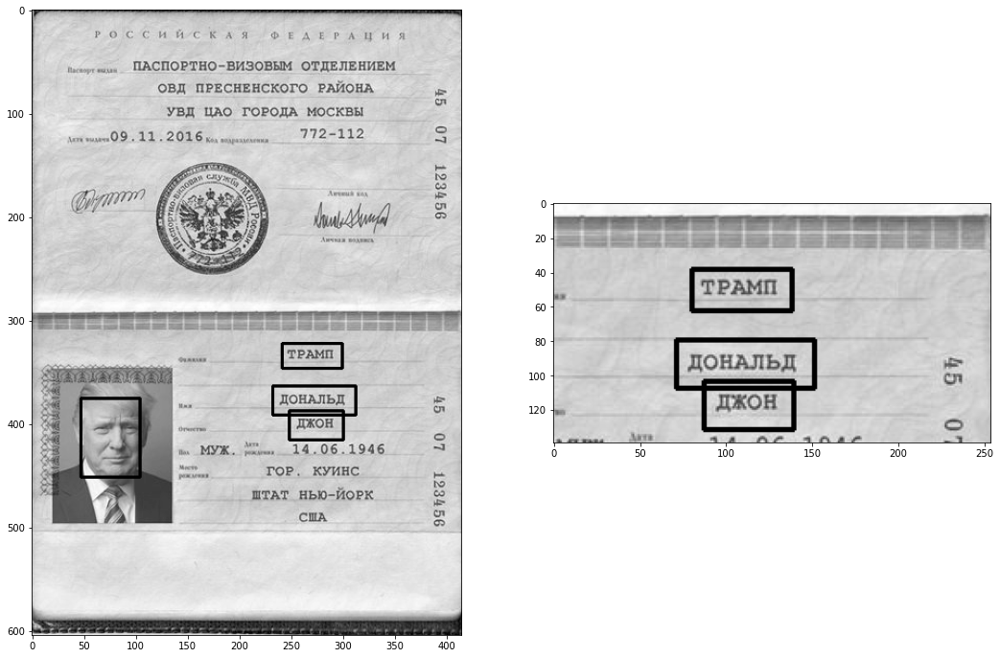

Сырой результат: {'Фамилия': 'ТРАМП', 'Имя': 'дональд', 'Отчество': 'дхон'}
В верхнем регистре: {'Фамилия': 'ТРАМП', 'Имя': 'ДОНАЛЬД', 'Отчество': 'ДХОН'}
----------------------------------------
1/1 [==============================] - 0s 27ms/step
Фамилия: хАлАБудиНА		; confidence_model= 0.5077855587005615
Фамилия: ХАЛАБУДИНА		; confidence_model= 0.6765901446342468
Имя: ЮпИЯ		; confidence_model= 0.5662386417388916
Имя: ЮЛИЯ -		; confidence_model= 0.4251847565174103
Отчество: АЛЕКСЕЕВНА.		; confidence_model= 0.8105152249336243
Отчество: АЛЕКСЕЕВНА..		; confidence_model= 0.48061442375183105


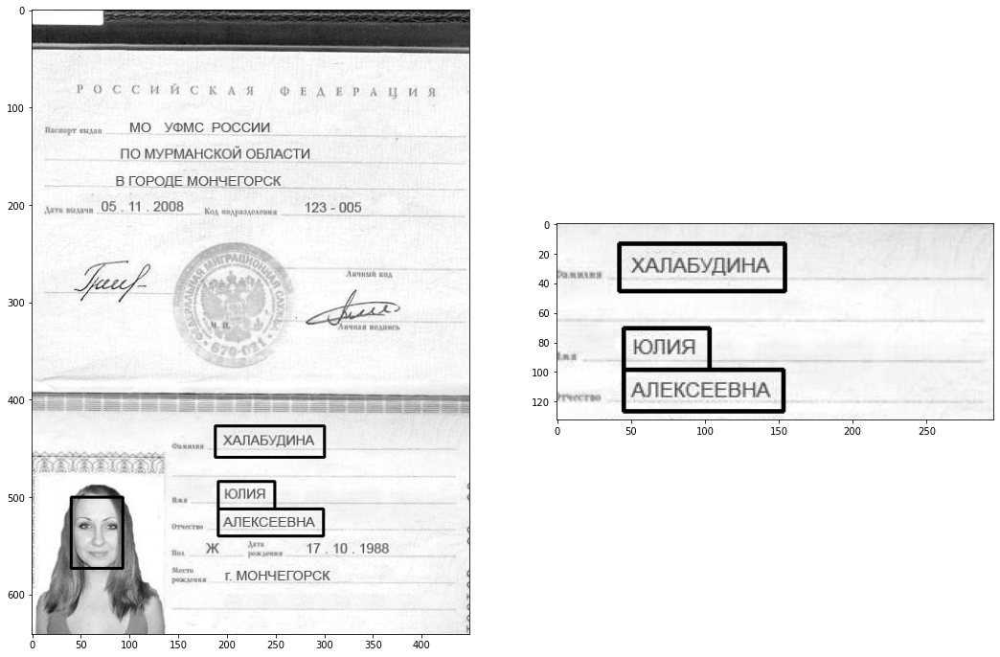

Сырой результат: {'Фамилия': 'ХАЛАБУДИНА', 'Имя': 'ЮпИЯ', 'Отчество': 'АЛЕКСЕЕВНА.'}
В верхнем регистре: {'Фамилия': 'ХАЛАБУДИНА', 'Имя': 'ЮПИЯ', 'Отчество': 'АЛЕКСЕЕВНА.'}
----------------------------------------
1/1 [==============================] - 0s 34ms/step
Фамилия: шапошникова		; confidence_model= 0.4390174150466919
Фамилия: ПАПОШНИКОВА[		; confidence_model= 0.21515880525112152
Имя: .виктовия		; confidence_model= 0.39695170521736145
Имя: ВИКТОРИЯ)[)		; confidence_model= 0.21162770688533783
Отчество: НИКОЛАЕВНА		; confidence_model= 0.7419395446777344
Отчество: НИКОЛАЕВНА 		; confidence_model= 0.20289620757102966


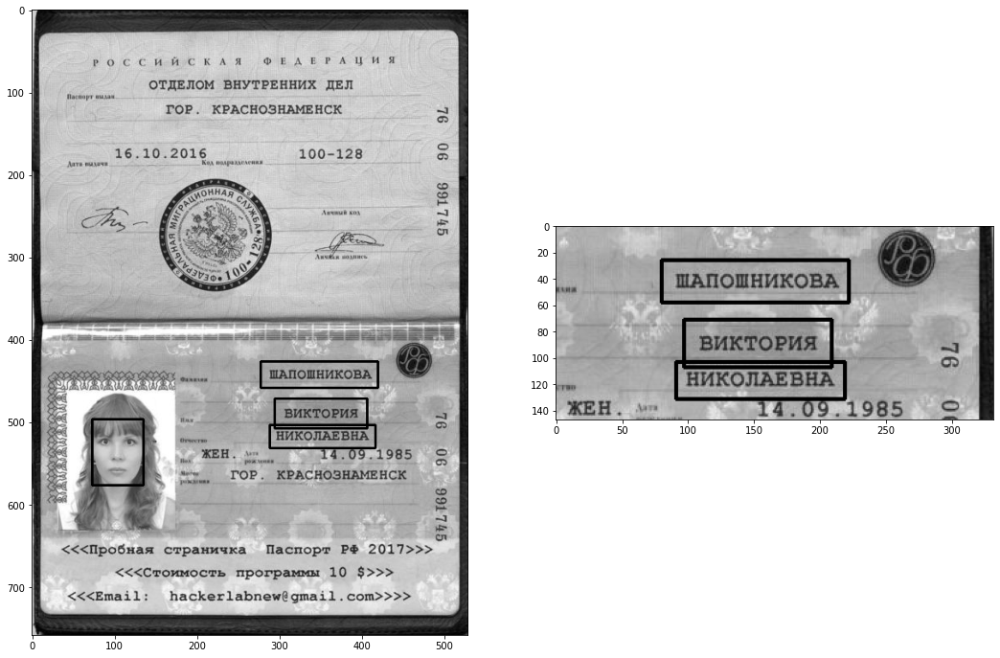

Сырой результат: {'Фамилия': 'шапошникова', 'Имя': '.виктовия', 'Отчество': 'НИКОЛАЕВНА'}
В верхнем регистре: {'Фамилия': 'ШАПОШНИКОВА', 'Имя': '.ВИКТОВИЯ', 'Отчество': 'НИКОЛАЕВНА'}
----------------------------------------
1/1 [==============================] - 0s 30ms/step
Фамилия: даймонд		; confidence_model= 0.6925422549247742
Фамилия: ДАЙМОНД		; confidence_model= 0.881123423576355
Имя: дмитвий		; confidence_model= 0.46243521571159363
Имя: ДИИЕРИЙ		; confidence_model= 0.9599749445915222
Отчество: АЛЕКСЕЕВИЧ		; confidence_model= 0.5866616368293762
Отчество: АЛЕКСЕЕВИЧ		; confidence_model= 0.5503514409065247


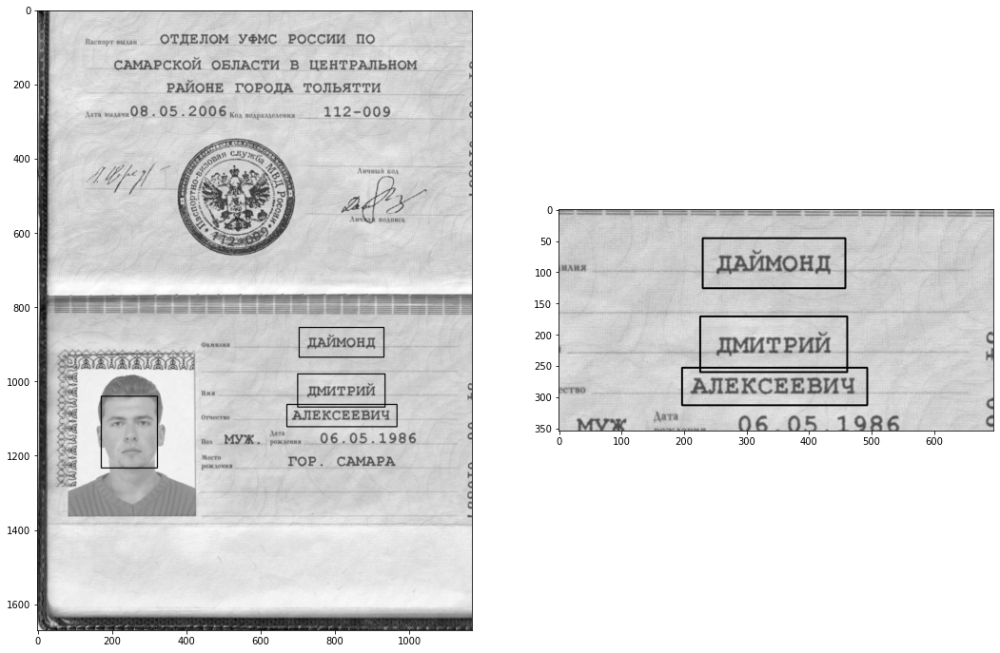

Сырой результат: {'Фамилия': 'ДАЙМОНД', 'Имя': 'ДИИЕРИЙ', 'Отчество': 'АЛЕКСЕЕВИЧ'}
В верхнем регистре: {'Фамилия': 'ДАЙМОНД', 'Имя': 'ДИИЕРИЙ', 'Отчество': 'АЛЕКСЕЕВИЧ'}
----------------------------------------
1/1 [==============================] - 0s 31ms/step
Фамилия: с:эк:л!лв		; confidence_model= 0.514691948890686
Фамилия: СОКОЛОВ;		; confidence_model= 0.24564026296138763
Имя: АндРЕй		; confidence_model= 0.827900230884552
Имя: АНДРЕЙ		; confidence_model= 0.26392242312431335
Отчество: АНДРЕЕвич		; confidence_model= 0.5022202134132385
Отчество: АНДРЕЕВИЧ		; confidence_model= 0.46396559476852417


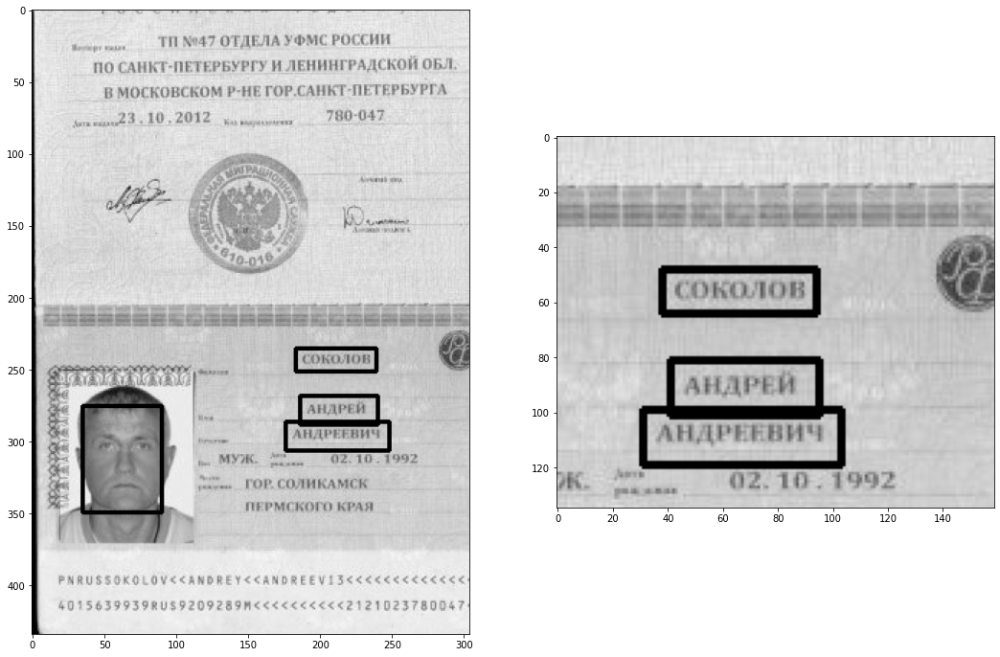

Сырой результат: {'Фамилия': 'с:эк:л!лв', 'Имя': 'АндРЕй', 'Отчество': 'АНДРЕЕвич'}
В верхнем регистре: {'Фамилия': 'С:ЭК:Л!ЛВ', 'Имя': 'АНДРЕЙ', 'Отчество': 'АНДРЕЕВИЧ'}
----------------------------------------
1/1 [==============================] - 0s 31ms/step
Фамилия: МАКАРОВ		; confidence_model= 0.8679690957069397
Фамилия: МАКАРОВ Ж		; confidence_model= 0.1894494593143463
Имя: РОМАН		; confidence_model= 0.9803653955459595
Имя: РОМАН Ж		; confidence_model= 0.18526114523410797
Отчество: 0РьЕвич		; confidence_model= 0.5945520997047424
Отчество: ЮРЬЕВИЧЖ		; confidence_model= 0.18239542841911316


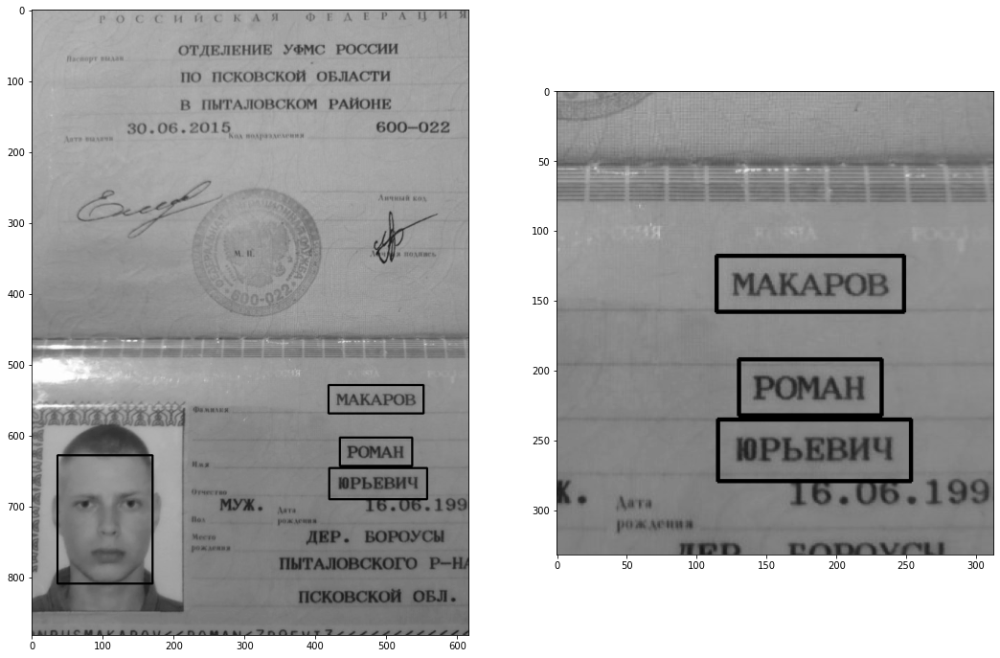

Сырой результат: {'Фамилия': 'МАКАРОВ', 'Имя': 'РОМАН', 'Отчество': '0РьЕвич'}
В верхнем регистре: {'Фамилия': 'МАКАРОВ', 'Имя': 'РОМАН', 'Отчество': '0РЬЕВИЧ'}
----------------------------------------
1/1 [==============================] - 0s 34ms/step
Фамилия: заслевский		; confidence_model= 0.40546634793281555
Фамилия: АСЛЕВСКИХ -		; confidence_model= 0.48833081126213074
Имя: теигоеий		; confidence_model= 0.6087763905525208
Имя: "И"ОЕИЙ		; confidence_model= 0.2889418601989746
Отчество: я:трович		; confidence_model= 0.5320039391517639
Отчество: ЛЕТРОВИЧ		; confidence_model= 0.47074630856513977


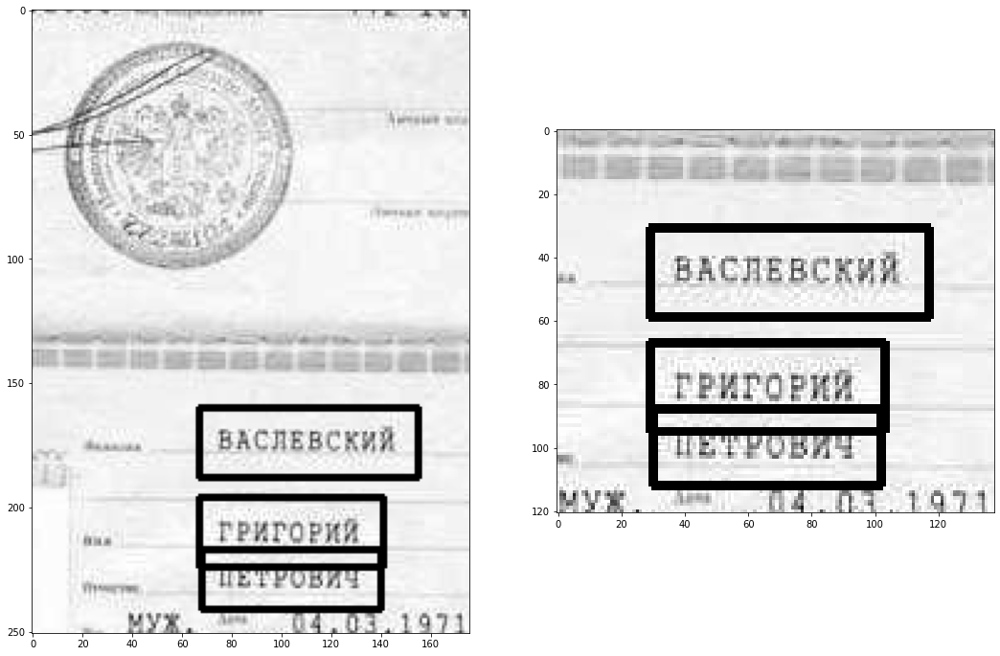

Сырой результат: {'Фамилия': 'АСЛЕВСКИХ -', 'Имя': 'теигоеий', 'Отчество': 'я:трович'}
В верхнем регистре: {'Фамилия': 'АСЛЕВСКИХ -', 'Имя': 'ТЕИГОЕИЙ', 'Отчество': 'Я:ТРОВИЧ'}
----------------------------------------
1/1 [==============================] - 0s 28ms/step
Фамилия: имяРвк		; confidence_model= 0.7522019743919373
Фамилия: ИМЯРЕК		; confidence_model= 0.5111219882965088
Имя: ввгвний		; confidence_model= 0.6173012256622314
Имя: ВВГЕНИИ		; confidence_model= 0.49577876925468445
Отчество: АЛЕКСАНдРОвич		; confidence_model= 0.5029310584068298
Отчество: АЛЕКСАНДРОВИЧ		; confidence_model= 0.5917221307754517


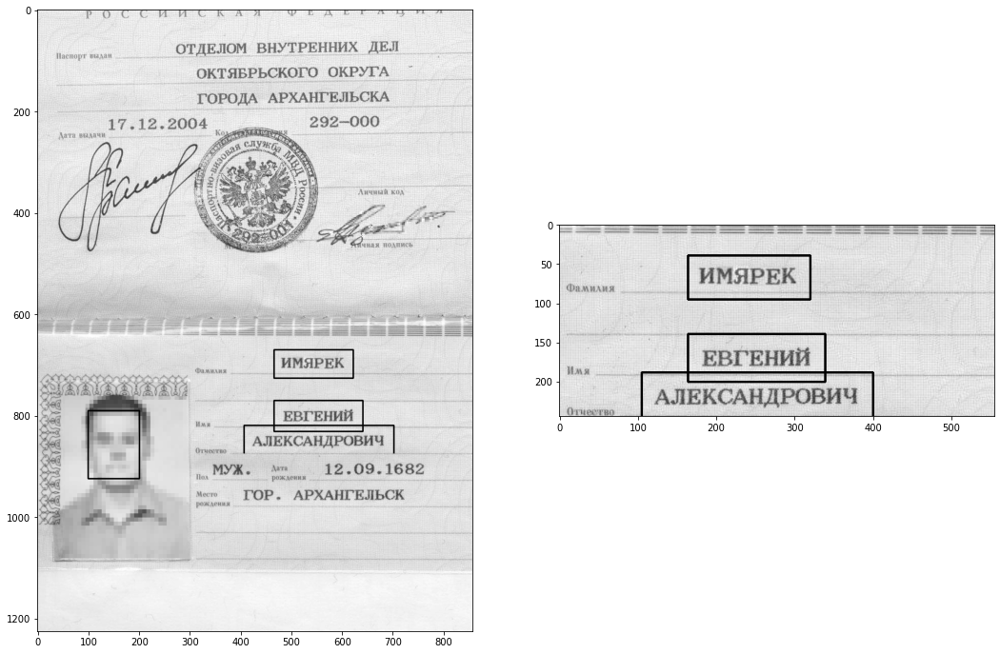

Сырой результат: {'Фамилия': 'имяРвк', 'Имя': 'ввгвний', 'Отчество': 'АЛЕКСАНДРОВИЧ'}
В верхнем регистре: {'Фамилия': 'ИМЯРВК', 'Имя': 'ВВГВНИЙ', 'Отчество': 'АЛЕКСАНДРОВИЧ'}
----------------------------------------
1/1 [==============================] - 0s 27ms/step
Фамилия: КУЗЕВАнОВ		; confidence_model= 0.6828227639198303
Фамилия: КУЗВВАНОВ		; confidence_model= 0.5438650846481323
Имя: АлвксАндР		; confidence_model= 0.3866293728351593
Имя: АЛЕКСАНДР		; confidence_model= 0.6811248064041138
Отчество: игоРввич		; confidence_model= 0.6921010613441467
Отчество: ИГОРВВИЧ		; confidence_model= 0.5792962312698364


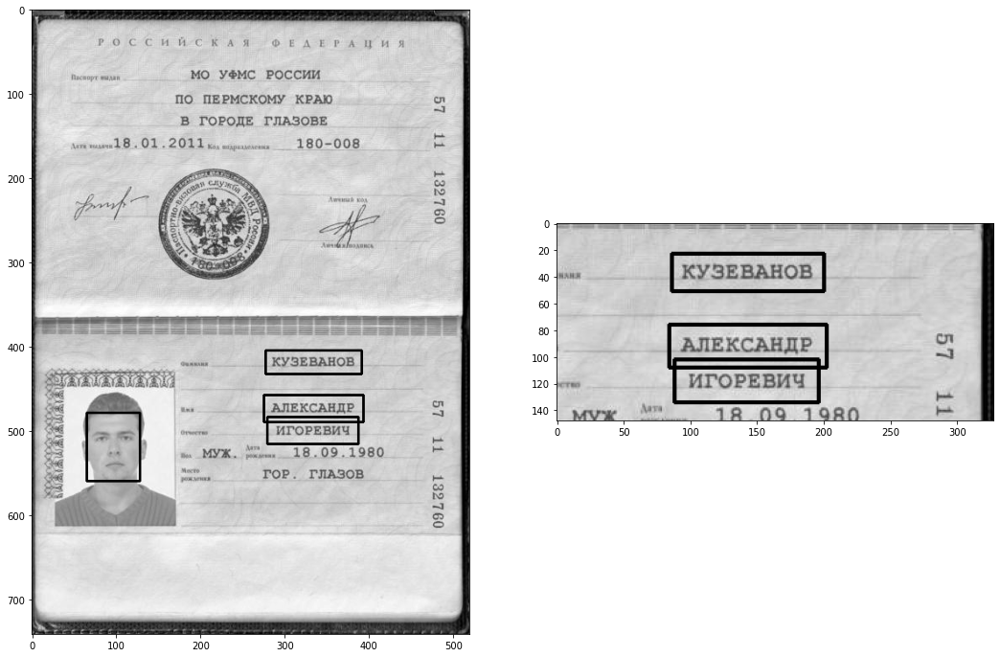

Сырой результат: {'Фамилия': 'КУЗЕВАнОВ', 'Имя': 'АЛЕКСАНДР', 'Отчество': 'игоРввич'}
В верхнем регистре: {'Фамилия': 'КУЗЕВАНОВ', 'Имя': 'АЛЕКСАНДР', 'Отчество': 'ИГОРВВИЧ'}
----------------------------------------
1/1 [==============================] - 0s 42ms/step
Фамилия: ."АКАЕВА		; confidence_model= 0.43367764353752136
Фамилия: 6МАКАЕВА		; confidence_model= 0.6613945960998535
Имя: ханна		; confidence_model= 0.49096354842185974
Имя: ,ЖАШАДД		; confidence_model= 0.352402001619339
Отчество: АнАтольЕвнА		; confidence_model= 0.8855753540992737
Отчество: АНАТОЛЬ:ВША		; confidence_model= 0.41918569803237915


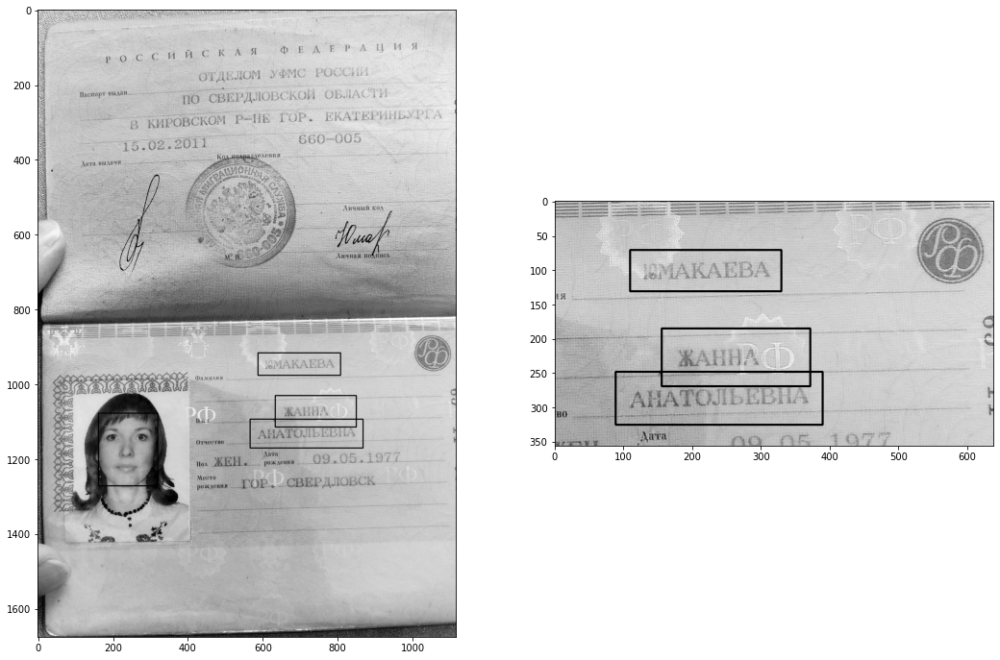

Сырой результат: {'Фамилия': '6МАКАЕВА', 'Имя': 'ханна', 'Отчество': 'АнАтольЕвнА'}
В верхнем регистре: {'Фамилия': '6МАКАЕВА', 'Имя': 'ХАННА', 'Отчество': 'АНАТОЛЬЕВНА'}
----------------------------------------


In [ ]:
doc_reader_conf = dict(temp_file=CURRENT, tr_conf=0.25, show_boxes=True, verbose=True)
fio_reader = PassportReader3(face_detector, 
                             recognizers, 
                             text_detector,
                             **doc_reader_conf
                             )

for file_name in filenames:
    try:
        answer = fio_reader.get_name_from_image(file_name)
        print("Сырой результат:", answer)
        print("В верхнем регистре:", {k: v.upper() for k, v in answer.items()})
    except NotFacesFoundError:
        print("Not found face --> aborted")
    except NameNotFoundError as e:
        print("NameNotFoundError <> file_name, texts:", file_name)
    print("--" * 20)


### test detector + recognizer

Cвоя детекция работает не особо. Остановился на перемножении масок перед определением контуров. Как вариант - надо тоже или гридсеарч использовать или переходить к сетке (что-то типа YOLO)...

0.jpeg erode_kernel= (1, 1) ; dilate_kernel= (15, 4) ; denoiser= gaussian
1/1 [==============================] - 0s 40ms/step
Фамилия: твамп		; confidence_model= 0.5575841665267944
Фамилия: .ТРАИП3		; confidence_model= 0.35701707005500793
Имя: дональд		; confidence_model= 0.6189378499984741
Имя: ДОВАЛЬД		; confidence_model= 0.5828310251235962
Отчество:  дхон		; confidence_model= 0.8935084342956543
Отчество: ДКОН		; confidence_model= 0.6006819605827332


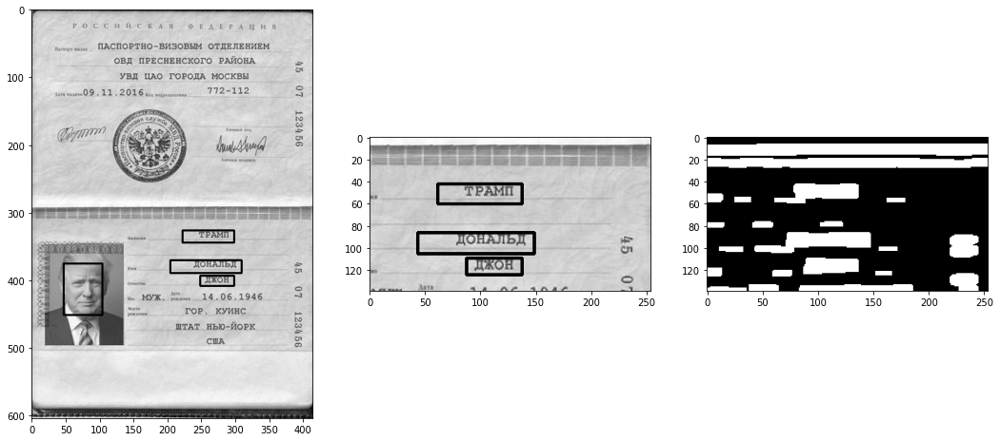

res= {'Фамилия': 'ТВАМП', 'Имя': 'ДОНАЛЬД', 'Отчество': ' ДХОН'}
----------------------------------------
1.jpeg erode_kernel= (1, 1) ; dilate_kernel= (15, 4) ; denoiser= gaussian
1/1 [==============================] - 0s 29ms/step
Фамилия: хАЛАБуДИНА		; confidence_model= 0.4585638642311096
Фамилия: .ХАЛАБУДИНА		; confidence_model= 0.5333356261253357
Имя: юлия		; confidence_model= 0.7358341217041016
Имя:  ЛИЯ		; confidence_model= 0.22941188514232635
Отчество: АЛЕКСЕЕВНА..		; confidence_model= 0.5731042623519897
Отчество: :АЛЕКСЕЕВНА..		; confidence_model= 0.5251069068908691


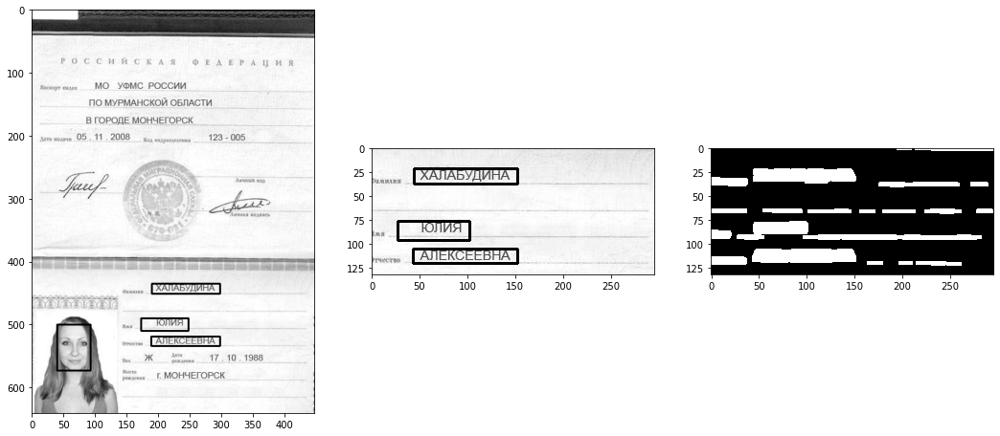

res= {'Фамилия': '.ХАЛАБУДИНА', 'Имя': 'ЮЛИЯ', 'Отчество': 'АЛЕКСЕЕВНА..'}
----------------------------------------
2.jpeg erode_kernel= (1, 1) ; dilate_kernel= (15, 4) ; denoiser= gaussian
1/1 [==============================] - 0s 41ms/step
Фамилия: ПАПОПНИКОВА   "		; confidence_model= 0.3572666347026825
Фамилия: ОД., ПАПОПНИКОВА Д 9		; confidence_model= 0.17753592133522034
Имя: ВИКТОРИЯ		; confidence_model= 0.275844007730484
Имя: ВИКТОРИЯ )		; confidence_model= 0.21807867288589478
Отчество: НИКОЛАЕВНА		; confidence_model= 0.5729058384895325
Отчество: НИКОЛАЕВНА 		; confidence_model= 0.20020295679569244


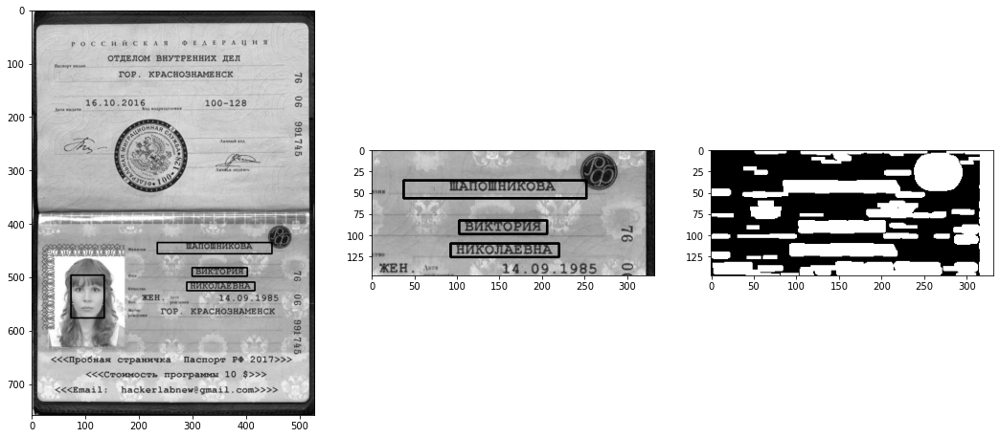

res= {'Фамилия': 'ПАПОПНИКОВА   "', 'Имя': 'ВИКТОРИЯ', 'Отчество': 'НИКОЛАЕВНА'}
----------------------------------------
3.jpeg erode_kernel= (1, 1) ; dilate_kernel= (15, 4) ; denoiser= gaussian
1/1 [==============================] - 0s 36ms/step
Фамилия: ДАЙМОНД		; confidence_model= 0.8306252360343933
Фамилия: ОДАЙМОНД		; confidence_model= 0.4657883942127228
Имя: ДМИТРИЙ-.:		; confidence_model= 0.22652876377105713
Имя: ДМИ"РИЙ.:		; confidence_model= 0.3277566134929657
Отчество:  А.ЛЕ К(СЕ Е ВИЧ		; confidence_model= 0.5506189465522766
Отчество: АЛЕКСЕЕВИЧ		; confidence_model= 0.713775634765625


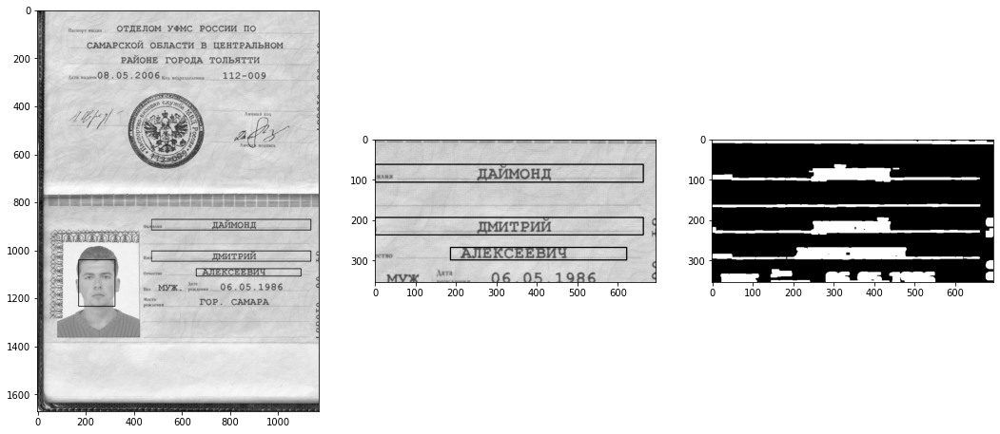

res= {'Фамилия': 'ДАЙМОНД', 'Имя': 'ДМИ"РИЙ.:', 'Отчество': 'АЛЕКСЕЕВИЧ'}
----------------------------------------
4.png erode_kernel= (1, 1) ; dilate_kernel= (15, 4) ; denoiser= gaussian
1/1 [==============================] - 0s 36ms/step
t_boxes: [(0, 120, 51, 13), (39, 85, 56, 11)]
NameNotFoundError <> file_name, texts: 4.png
----------------------------------------
5.jpeg erode_kernel= (1, 1) ; dilate_kernel= (15, 4) ; denoiser= gaussian
1/1 [==============================] - 0s 32ms/step
t_boxes: []
NameNotFoundError <> file_name, texts: 5.jpeg
----------------------------------------
6.jpeg erode_kernel= (1, 1) ; dilate_kernel= (15, 4) ; denoiser= gaussian
1/1 [==============================] - 0s 37ms/step
Фамилия:  аслевский		; confidence_model= 0.688289999961853
Фамилия: АСЛЕВСКИХ .		; confidence_model= 0.420610636472702
Имя:  еиго>йи		; confidence_model= 0.22675321996212006
Имя: ТРИСО?ИЙ.		; confidence_model= 0.4632178246974945
Отчество:  етрович		; confidence_model= 0.656467

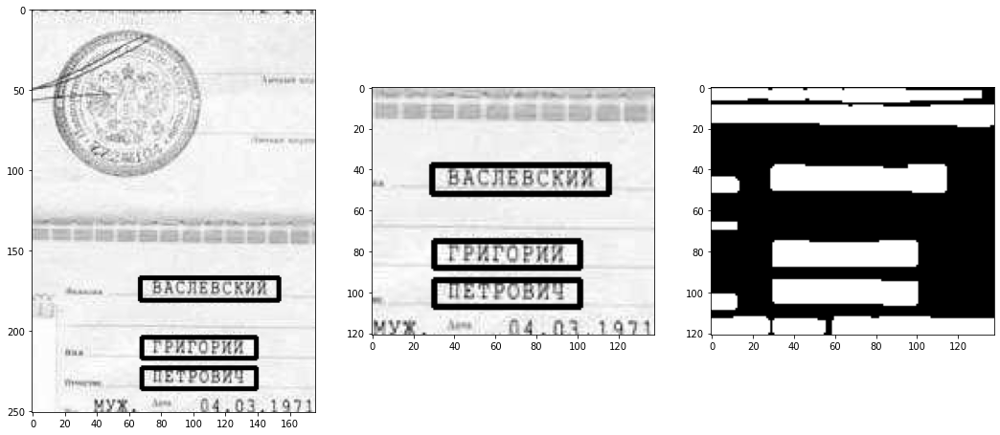

res= {'Фамилия': ' АСЛЕВСКИЙ', 'Имя': 'ТРИСО?ИЙ.', 'Отчество': ' ЕТРОВИЧ'}
----------------------------------------
7.jpeg erode_kernel= (1, 1) ; dilate_kernel= (15, 4) ; denoiser= gaussian
1/1 [==============================] - 0s 34ms/step
Фамилия: ИМЯРЕК		; confidence_model= 0.6875466704368591
Фамилия: ИМЯРЕК		; confidence_model= 0.8482025265693665
Имя: ЕВТ"ЕНИЙ		; confidence_model= 0.6427565217018127
Имя: ЕВГЕНИЙ		; confidence_model= 0.6419080495834351
Отчество:  А.ЛЕКСАНДРОВИЧ		; confidence_model= 0.5267562866210938
Отчество: А.ЛЕКСАНДРОВИЧ		; confidence_model= 0.5118515491485596


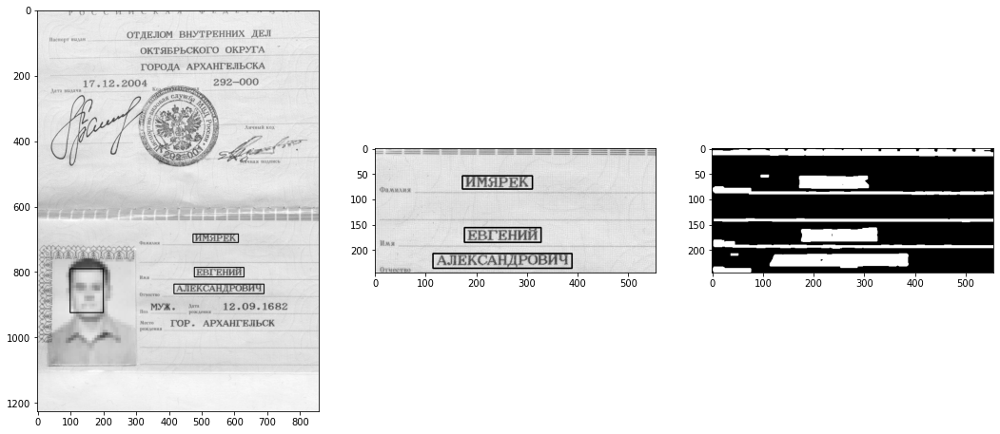

res= {'Фамилия': 'ИМЯРЕК', 'Имя': 'ЕВТ"ЕНИЙ', 'Отчество': ' А.ЛЕКСАНДРОВИЧ'}
----------------------------------------
8.jpeg erode_kernel= (1, 1) ; dilate_kernel= (15, 4) ; denoiser= gaussian
1/1 [==============================] - 0s 31ms/step
Фамилия:  КУЗЕвАнов		; confidence_model= 0.2923913300037384
Фамилия: КУЗЕВАНОВ		; confidence_model= 0.5657144784927368
Имя: АЛЕКСАНДР		; confidence_model= 0.5158048272132874
Имя: АЛЕКСАНДР		; confidence_model= 0.6459251046180725
Отчество:  ИОРЕвич		; confidence_model= 0.4343850016593933
Отчество: ИГОРЕВИЧ		; confidence_model= 0.6341400742530823


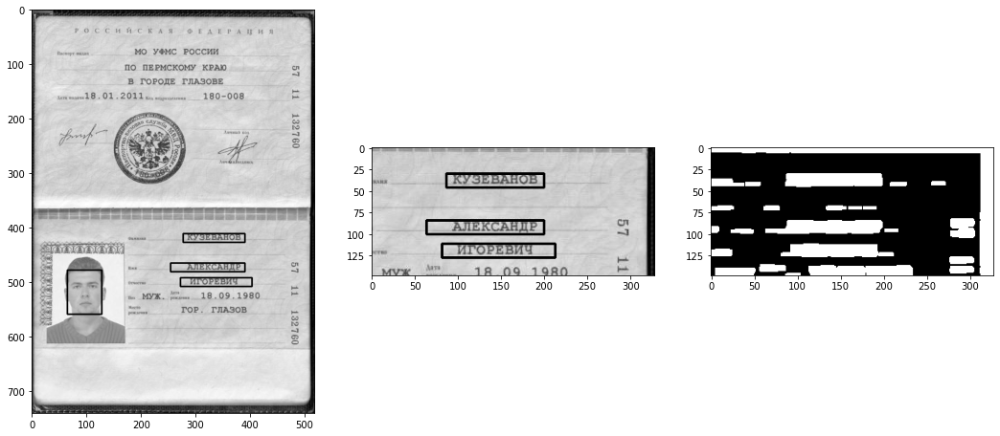

res= {'Фамилия': 'КУЗЕВАНОВ', 'Имя': 'АЛЕКСАНДР', 'Отчество': 'ИГОРЕВИЧ'}
----------------------------------------
9.jpeg erode_kernel= (1, 1) ; dilate_kernel= (15, 4) ; denoiser= gaussian
1/1 [==============================] - 0s 43ms/step
Фамилия: , МАКАЕВЗА.		; confidence_model= 0.3301587700843811
Фамилия: !8МАКАЕВА3		; confidence_model= 0.5185244679450989
Имя: АН!Н2.		; confidence_model= 0.39405766129493713
Имя: ЖАННА		; confidence_model= 0.6355592012405396
Отчество: АНАТОЛЬЕЕНА.		; confidence_model= 0.5027651786804199
Отчество: АНАТОЛЬЕВНА.		; confidence_model= 0.6011282205581665


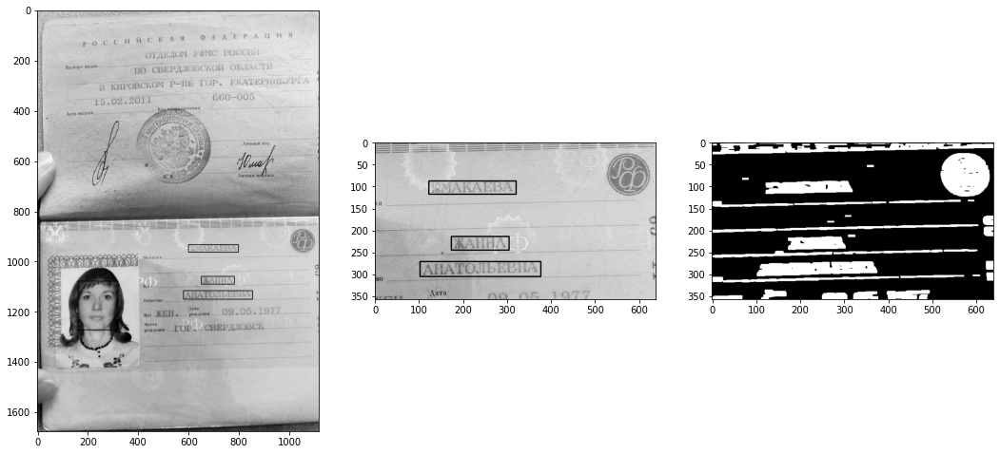

res= {'Фамилия': '!8МАКАЕВА3', 'Имя': 'ЖАННА', 'Отчество': 'АНАТОЛЬЕВНА.'}
----------------------------------------


In [ ]:
doc_reader_conf = dict(temp_file=CURRENT, tr_conf=0.25, show_boxes=True, verbose=True)
# Перебором получены следующие параметры для детекции:
er_ker = (1, 1)
d_ker = (15, 4)
denoiser = 'gaussian'
dilate_iterations = 1
# for d_ker in ((15, 5), (15,4)):
#     denoiser = 'gaussian'
#     for er_ker in ((1, 1), None):                
#         for denoiser in ('billateral', 'gaussian', None):                      # ('billateral', 'rolling_boll', 'gaussian', None)
fio_reader = PassportReaderSimple(face_detector, 
                                recognizers, 
                                **doc_reader_conf,
                                denoiser=denoiser,
                                erode_kernel=er_ker,
                                dilate_kernel=d_ker,
                                dilate_iterations=dilate_iterations,
                                add_margin=7
                                )

for file_name in filenames:
    print(file_name, "erode_kernel=", er_ker, "; dilate_kernel=", d_ker, "; denoiser=", denoiser)
    try:
        boxes = fio_reader.get_name_from_image(file_name)
        print("res=", boxes)
    except NotFacesFoundError:
        print("Not found face --> aborted")
    except NameNotFoundError as e:
        print("NameNotFoundError <> file_name, texts:", file_name)
    print("--" * 20)

субъективно: очистка от шума целевой области методами "gaussian", "rolling_boll"  (последний - более затратен по времени) дает лучшую точность в определении контуров текста.
Еще лучше определяются контуры после перемножения масок (последний вариант) , - но дорого по времени. 
Нет определенности с ядрами... - численное задание ядер выглядит очень костыльно. И результат весьма чувствителен к размерам ядерю Равно, как и подбор коэффициентов для отфильтровки.
OCR тоже есть куда улучшать.

60 178.0 216


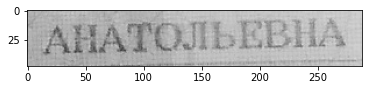

In [ ]:
img = cv2.imread(CURRENT, 0)
print(img.min(), np.median(img), img.max())
plt.imshow(img, cmap='gray', vmin=0, vmax=255)